# 🧠 Deep Learning Lab 6
## Design & Implementation of Generative Models
### VAE · GAN · CGAN · DCGAN
**Institute:** Sardar Vallabhbhai National Institute of Technology, Surat — 395007  
**Department:** Artificial Intelligence | **Course:** AI302 Deep Learning

---
**Datasets:** EMNIST (Balanced, 47 classes) | Fashion-MNIST (10 classes)  
**Problem Statements:**
1. Variational Autoencoder (VAE)
2. Vanilla GAN (Goodfellow et al., 2014)
3. Conditional GAN (CGAN)
4. Deep Convolutional GAN (DCGAN)
5. Comparative Study
6. Data Augmentation using Generative Models
7. Loss Function & Training Stability Analysis

## ⚙️ Setup — Imports, Device, Seed

In [1]:
import os, random, copy, time, warnings
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset

import torchvision
from torchvision import datasets, transforms

from sklearn.manifold import TSNE

warnings.filterwarnings('ignore')

# ── Device ────────────────────────────────────────────────────
if torch.cuda.is_available():
    device = torch.device('cuda')
elif hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')

print(f"PyTorch      : {torch.__version__}")
print(f"Torchvision  : {torchvision.__version__}")
print(f"Device       : {device}")

# ── Reproducibility ───────────────────────────────────────────
SEED = 42
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s); torch.manual_seed(s)
    if torch.cuda.is_available(): torch.cuda.manual_seed_all(s)
set_seed()

# ── Global Hyperparameters ─────────────────────────────────────
EPOCHS      = 5          # ← set to 50+ for better results
BATCH_SIZE  = 128
LR_VAE      = 1e-3
LR_GAN      = 2e-4
Z_DIM_GAN   = 100
IMG_SIZE    = 28
OUT_DIR     = "lab6_outputs"
os.makedirs(OUT_DIR, exist_ok=True)
print(f"\nEpochs        : {EPOCHS}")
print(f"Batch size    : {BATCH_SIZE}")
print(f"Output dir    : {OUT_DIR}/")

PyTorch      : 2.9.1
Torchvision  : 0.24.1
Device       : mps

Epochs        : 5
Batch size    : 128
Output dir    : lab6_outputs/


## 📦 Datasets — EMNIST & Fashion-MNIST

In [2]:
# ── Transforms ────────────────────────────────────────────────
tfm_01 = transforms.Compose([transforms.ToTensor()])                       # [0,1]
tfm_11 = transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize([0.5],[0.5])])          # [-1,1]

# ── EMNIST Balanced ───────────────────────────────────────────
emnist_train_01 = datasets.EMNIST(root='./data', split='balanced', train=True,
                                   download=True, transform=tfm_01)
emnist_test_01  = datasets.EMNIST(root='./data', split='balanced', train=False,
                                   download=True, transform=tfm_01)
emnist_train_11 = datasets.EMNIST(root='./data', split='balanced', train=True,
                                   download=True, transform=tfm_11)
EM_CLASSES = 47

# ── Fashion-MNIST ─────────────────────────────────────────────
fmnist_train_01 = datasets.FashionMNIST(root='./data', train=True,
                                         download=True, transform=tfm_01)
fmnist_test_01  = datasets.FashionMNIST(root='./data', train=False,
                                         download=True, transform=tfm_01)
fmnist_train_11 = datasets.FashionMNIST(root='./data', train=True,
                                         download=True, transform=tfm_11)
fmnist_test_11  = datasets.FashionMNIST(root='./data', train=False,
                                         download=True, transform=tfm_11)
FM_CLASSES = 10
FM_LABELS  = ['T-shirt','Trouser','Pullover','Dress','Coat',
               'Sandal','Shirt','Sneaker','Bag','Ankle boot']

def make_loader(ds, shuffle=True, num_workers=2):
    return DataLoader(ds, batch_size=BATCH_SIZE, shuffle=shuffle,
                      num_workers=num_workers, pin_memory=True)

print(f"EMNIST       train: {len(emnist_train_01):,}  test: {len(emnist_test_01):,}  classes: {EM_CLASSES}")
print(f"FashionMNIST train: {len(fmnist_train_01):,}  test: {len(fmnist_test_01):,}  classes: {FM_CLASSES}")

EMNIST       train: 112,800  test: 18,800  classes: 47
FashionMNIST train: 60,000  test: 10,000  classes: 10


## 🛠 Utility Functions

In [3]:
def save_image_grid(imgs, title, fname, nrow=8, denorm=False):
    """Save a grid of images (tensor B×1×H×W) to OUT_DIR."""
    imgs = imgs.detach().cpu()
    if denorm:
        imgs = (imgs * 0.5 + 0.5).clamp(0, 1)
    else:
        imgs = imgs.clamp(0, 1)
    n = min(len(imgs), nrow * nrow)
    fig, axes = plt.subplots(nrow, nrow, figsize=(nrow, nrow))
    for i, ax in enumerate(axes.flat):
        if i < n:
            ax.imshow(imgs[i].squeeze().numpy(), cmap='gray')
        ax.axis('off')
    fig.suptitle(title, fontsize=10, fontweight='bold')
    plt.tight_layout()
    path = fname if os.path.dirname(fname) else os.path.join(OUT_DIR, fname)
    os.makedirs(os.path.dirname(path) or '.', exist_ok=True)
    plt.savefig(path, dpi=120, bbox_inches='tight')
    plt.show()
    plt.close()
    print(f"  Saved → {path}")


def plot_losses(losses_dict, title, fname):
    """Plot one or more loss curves."""
    fig, ax = plt.subplots(figsize=(8, 4))
    for label, vals in losses_dict.items():
        ax.plot(vals, label=label, linewidth=2)
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel('Epoch'); ax.set_ylabel('Loss')
    ax.legend(); ax.grid(True, alpha=0.3)
    plt.tight_layout()
    path = os.path.join(OUT_DIR, fname)
    plt.savefig(path, dpi=120, bbox_inches='tight')
    plt.show()
    plt.close()
    print(f"  Saved → {path}")


def pixel_variance(gen_fn, n=100):
    """Compute mean per-pixel variance across n generated images.
       Higher = more diverse output."""
    imgs = gen_fn(n).detach().cpu().numpy()   # (n, 1, 28, 28)
    return float(np.var(imgs, axis=0).mean())


print("Utility functions ready ✓")

Utility functions ready ✓


---
# 🔵 Problem Statement 1: Variational Autoencoder (VAE)

**Objective:** Learn a compact latent representation enabling high-quality reconstruction and random generation.

### Architecture Summary
| Component | Design |
|-----------|--------|
| Encoder | Conv2d → FC → two branches: μ and logσ² |
| Reparameterization | z = μ + ε·exp(0.5·logσ²), ε~N(0,I) |
| Decoder | FC → ConvTranspose2d → Sigmoid |
| Loss | ELBO = Recon (BCE) + β·KL, with KL Annealing (β: 0→1 over 10 epochs) |

### Tasks
1. Train on EMNIST & Fashion-MNIST, compare reconstruction quality
2. Latent Space Traversal (interpolate between two encodings)
3. Random Sampling from N(0,I)
4. Latent Dimension Study: z ∈ {8, 32, 128}
5. Conditional Latent Control (class-conditioned generation) + t-SNE

### PS1 — VAE Architecture

In [4]:
# ══════════════════════════════════════════════════════════════
# VAE Architecture
# ══════════════════════════════════════════════════════════════

class Encoder(nn.Module):
    """Convolutional Encoder → outputs μ and logσ²."""
    def __init__(self, z_dim=32, img_channels=1):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(img_channels, 32, 3, stride=2, padding=1),  # 14×14
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),            # 7×7
            nn.ReLU(),
        )
        self.fc       = nn.Linear(64 * 7 * 7, 256)
        self.fc_mu    = nn.Linear(256, z_dim)
        self.fc_logvar= nn.Linear(256, z_dim)

    def forward(self, x):
        h = self.conv(x).flatten(1)
        h = F.relu(self.fc(h))
        return self.fc_mu(h), self.fc_logvar(h)


class Decoder(nn.Module):
    """Mirror Decoder → Sigmoid output ∈ [0,1]."""
    def __init__(self, z_dim=32, img_channels=1):
        super().__init__()
        self.fc = nn.Sequential(
            nn.Linear(z_dim, 256), nn.ReLU(),
            nn.Linear(256, 64 * 7 * 7), nn.ReLU(),
        )
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1),  # 14×14
            nn.ReLU(),
            nn.ConvTranspose2d(32,  1, 4, stride=2, padding=1),  # 28×28
            nn.Sigmoid(),
        )

    def forward(self, z):
        h = self.fc(z).view(-1, 64, 7, 7)
        return self.deconv(h)


class VAE(nn.Module):
    """Full VAE: Encoder + Reparameterization + Decoder."""
    def __init__(self, z_dim=32):
        super().__init__()
        self.encoder = Encoder(z_dim)
        self.decoder = Decoder(z_dim)
        self.z_dim   = z_dim

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        return mu + torch.randn_like(std) * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z          = self.reparameterize(mu, logvar)
        return self.decoder(z), mu, logvar

    def sample(self, n, device):
        z = torch.randn(n, self.z_dim, device=device)
        return self.decoder(z)


def vae_loss(recon, x, mu, logvar, beta=1.0):
    bce = F.binary_cross_entropy(recon, x, reduction='sum') / x.size(0)
    kl  = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / x.size(0)
    return bce + beta * kl, bce.item(), kl.item()


# Quick check
_v = VAE(z_dim=32)
_x = torch.zeros(2, 1, 28, 28)
_r, _mu, _lv = _v(_x)
print(f"VAE test — in: {list(_x.shape)}  recon: {list(_r.shape)}  μ: {list(_mu.shape)}")
print("VAE architecture ready ✓")
del _v, _x, _r, _mu, _lv

VAE test — in: [2, 1, 28, 28]  recon: [2, 1, 28, 28]  μ: [2, 32]
VAE architecture ready ✓


### PS1 — VAE Training Loop (with KL Annealing)

In [5]:
def train_vae(vae, train_loader, dataset_name='Dataset',
              epochs=EPOCHS, lr=LR_VAE, kl_warmup=10):
    """
    Train VAE with KL Annealing:
    β linearly warms from 0 → 1 over the first kl_warmup epochs.
    """
    optimizer = optim.Adam(vae.parameters(), lr=lr)
    hist = {'total':[], 'recon':[], 'kl':[]}

    print(f"\nTraining VAE (z={vae.z_dim}) on {dataset_name} for {epochs} epochs...")
    print(f"  KL annealing: β warms 0→1 over {kl_warmup} epochs")

    for epoch in range(1, epochs + 1):
        vae.train()
        beta  = min(1.0, epoch / kl_warmup)
        t_loss = r_loss = k_loss = 0.0

        for x, _ in train_loader:
            x = x.to(device)
            optimizer.zero_grad()
            recon, mu, logvar = vae(x)
            loss, bce, kl = vae_loss(recon, x, mu, logvar, beta)
            loss.backward()
            optimizer.step()
            t_loss += loss.item(); r_loss += bce; k_loss += kl

        n = len(train_loader)
        hist['total'].append(t_loss/n)
        hist['recon'].append(r_loss/n)
        hist['kl'].append(k_loss/n)
        print(f"  Epoch {epoch:>3}/{epochs} | β={beta:.2f} | "
              f"Total={t_loss/n:.3f}  Recon={r_loss/n:.3f}  KL={k_loss/n:.3f}")

    return hist

print("VAE training function ready ✓")

VAE training function ready ✓


### PS1 — Task 1: Train on EMNIST & Fashion-MNIST


Training VAE (z=32) on EMNIST for 5 epochs...
  KL annealing: β warms 0→1 over 10 epochs
  Epoch   1/5 | β=0.10 | Total=168.997  Recon=163.249  KL=57.487
  Epoch   2/5 | β=0.20 | Total=123.264  Recon=110.839  KL=62.123
  Epoch   3/5 | β=0.30 | Total=124.925  Recon=108.438  KL=54.956
  Epoch   4/5 | β=0.40 | Total=127.727  Recon=108.044  KL=49.207
  Epoch   5/5 | β=0.50 | Total=130.989  Recon=108.561  KL=44.856


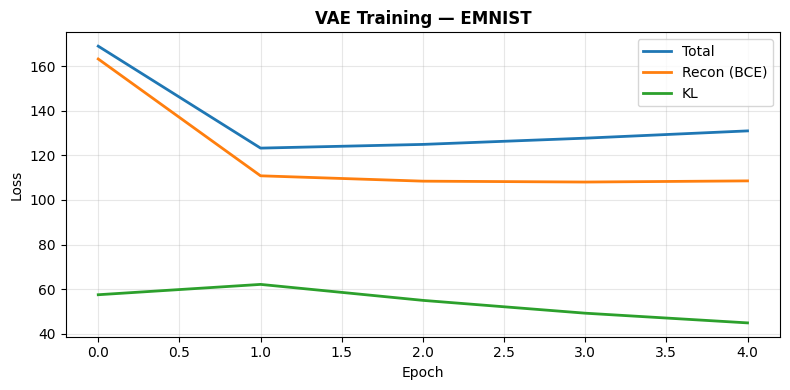

  Saved → lab6_outputs/PS1_vae_emnist_loss.png


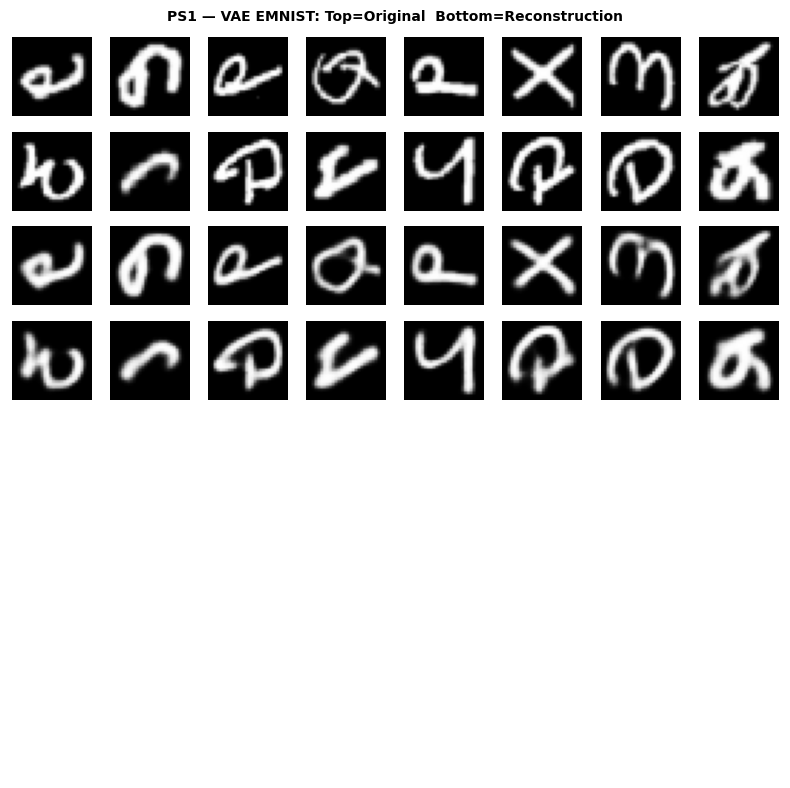

  Saved → lab6_outputs/PS1_vae_emnist_recon.png


In [6]:
# ── Task 1a: EMNIST ───────────────────────────────────────────
vae_emnist   = VAE(z_dim=32).to(device)
loader_em_tr = make_loader(emnist_train_01)
loader_em_ts = make_loader(emnist_test_01, shuffle=False)

hist_em = train_vae(vae_emnist, loader_em_tr, 'EMNIST')
plot_losses({'Total': hist_em['total'], 'Recon (BCE)': hist_em['recon'], 'KL': hist_em['kl']},
            'VAE Training — EMNIST', 'PS1_vae_emnist_loss.png')

vae_emnist.eval()
with torch.no_grad():
    x_sample, _ = next(iter(loader_em_ts))
    x_sample = x_sample[:32].to(device)
    recon_em, _, _ = vae_emnist(x_sample)

combined = torch.cat([x_sample[:16].cpu(), recon_em[:16].cpu()])
save_image_grid(combined, 'PS1 — VAE EMNIST: Top=Original  Bottom=Reconstruction',
                'PS1_vae_emnist_recon.png', nrow=8)


Training VAE (z=32) on Fashion-MNIST for 5 epochs...
  KL annealing: β warms 0→1 over 10 epochs
  Epoch   1/5 | β=0.10 | Total=268.272  Recon=263.879  KL=43.933
  Epoch   2/5 | β=0.20 | Total=235.763  Recon=228.358  KL=37.026
  Epoch   3/5 | β=0.30 | Total=233.003  Recon=223.984  KL=30.066
  Epoch   4/5 | β=0.40 | Total=232.379  Recon=221.951  KL=26.072
  Epoch   5/5 | β=0.50 | Total=232.833  Recon=221.021  KL=23.624


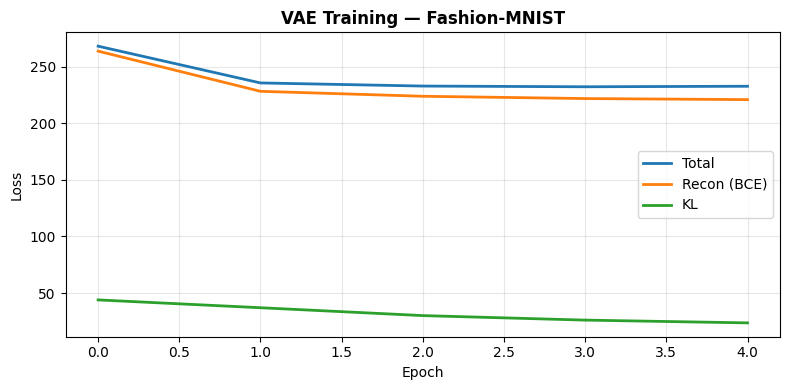

  Saved → lab6_outputs/PS1_vae_fmnist_loss.png


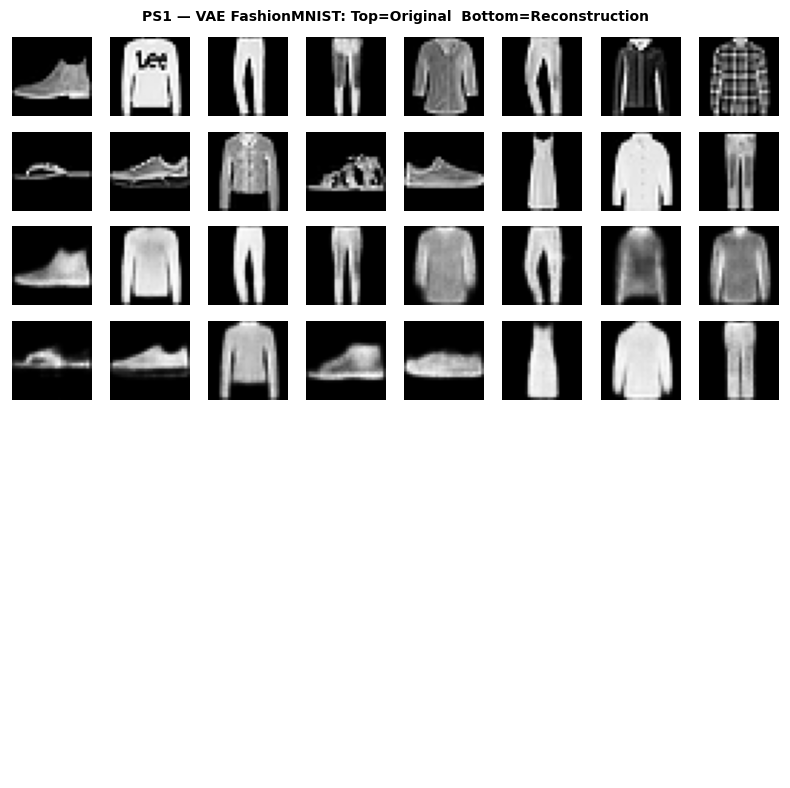

  Saved → lab6_outputs/PS1_vae_fmnist_recon.png

--- Task 1 Reconstruction Comparison ---
Dataset               Recon MSE  Final BCE
-------------------------------------------
EMNIST                  0.00957   108.5607
FashionMNIST            0.01404   221.0212


In [7]:
# ── Task 1b: Fashion-MNIST ────────────────────────────────────
vae_fmnist   = VAE(z_dim=32).to(device)
loader_fm_tr = make_loader(fmnist_train_01)
loader_fm_ts = make_loader(fmnist_test_01, shuffle=False)

hist_fm = train_vae(vae_fmnist, loader_fm_tr, 'Fashion-MNIST')
plot_losses({'Total': hist_fm['total'], 'Recon (BCE)': hist_fm['recon'], 'KL': hist_fm['kl']},
            'VAE Training — Fashion-MNIST', 'PS1_vae_fmnist_loss.png')

vae_fmnist.eval()
with torch.no_grad():
    x_fm, _ = next(iter(loader_fm_ts))
    x_fm = x_fm[:32].to(device)
    recon_fm, _, _ = vae_fmnist(x_fm)

combined_fm = torch.cat([x_fm[:16].cpu(), recon_fm[:16].cpu()])
save_image_grid(combined_fm, 'PS1 — VAE FashionMNIST: Top=Original  Bottom=Reconstruction',
                'PS1_vae_fmnist_recon.png', nrow=8)

# ── MSE Comparison ────────────────────────────────────────────
mse_em = F.mse_loss(recon_em, x_sample).item()
mse_fm = F.mse_loss(recon_fm, x_fm).item()
print("\n--- Task 1 Reconstruction Comparison ---")
print(f"{'Dataset':<20} {'Recon MSE':>10} {'Final BCE':>10}")
print("-" * 43)
print(f"{'EMNIST':<20} {mse_em:>10.5f} {hist_em['recon'][-1]:>10.4f}")
print(f"{'FashionMNIST':<20} {mse_fm:>10.5f} {hist_fm['recon'][-1]:>10.4f}")

### PS1 — Task 2: Latent Space Traversal (Interpolation)

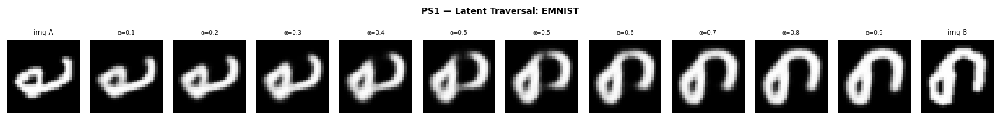

  Saved → lab6_outputs/PS1_vae_emnist_traversal.png


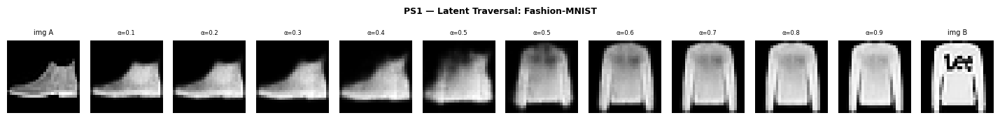

  Saved → lab6_outputs/PS1_vae_fmnist_traversal.png


In [8]:
def latent_traversal(vae, ds, n_steps=10, fname='PS1_vae_traversal.png', title=''):
    vae.eval()
    x0, _ = ds[0]; x1, _ = ds[1]
    x0 = x0.unsqueeze(0).to(device)
    x1 = x1.unsqueeze(0).to(device)

    with torch.no_grad():
        mu0, _ = vae.encoder(x0)
        mu1, _ = vae.encoder(x1)

    interp_imgs = []
    for alpha in np.linspace(0, 1, n_steps):
        z_mid = (1 - alpha) * mu0 + alpha * mu1
        with torch.no_grad():
            img = vae.decoder(z_mid)
        interp_imgs.append(img.squeeze(0).cpu())

    row = torch.stack([x0.squeeze(0).cpu()] + interp_imgs + [x1.squeeze(0).cpu()])
    fig, axes = plt.subplots(1, len(row), figsize=(len(row)*1.2, 1.8))
    for i, (ax, im) in enumerate(zip(axes, row)):
        ax.imshow(im.squeeze().numpy(), cmap='gray'); ax.axis('off')
        if i == 0: ax.set_title('img A', fontsize=7)
        elif i == len(row)-1: ax.set_title('img B', fontsize=7)
        else: ax.set_title(f'α={i/(n_steps+1):.1f}', fontsize=6)
    fig.suptitle(title or 'Latent Space Traversal', fontweight='bold', fontsize=9)
    plt.tight_layout()
    path = os.path.join(OUT_DIR, fname)
    plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
    print(f"  Saved → {path}")

latent_traversal(vae_emnist, emnist_test_01, fname='PS1_vae_emnist_traversal.png',
                 title='PS1 — Latent Traversal: EMNIST')
latent_traversal(vae_fmnist, fmnist_test_01, fname='PS1_vae_fmnist_traversal.png',
                 title='PS1 — Latent Traversal: Fashion-MNIST')

### PS1 — Task 3: Random Sampling from N(0, I)

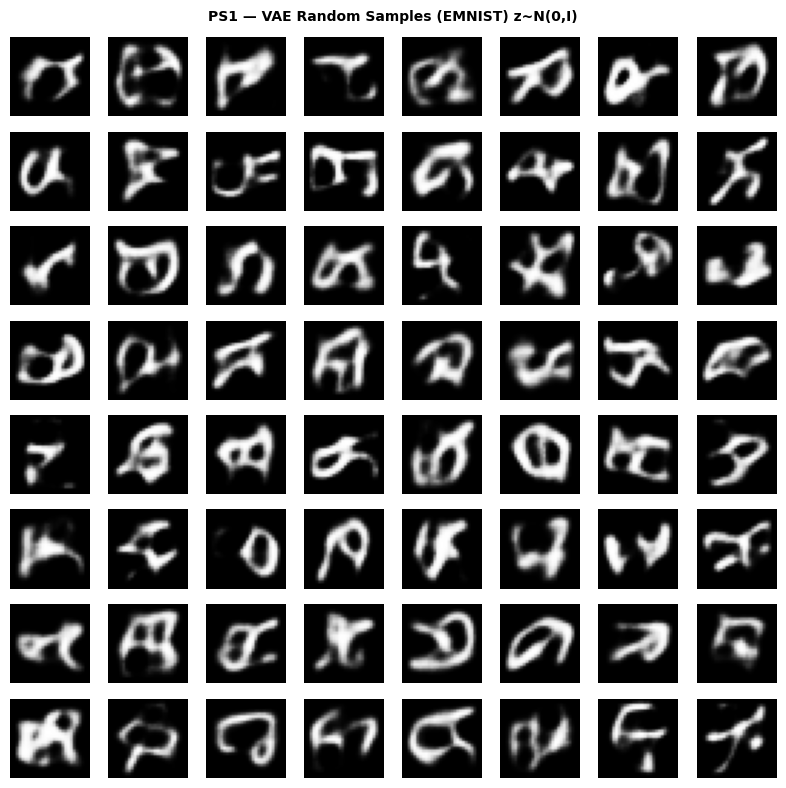

  Saved → lab6_outputs/PS1_vae_emnist_samples.png


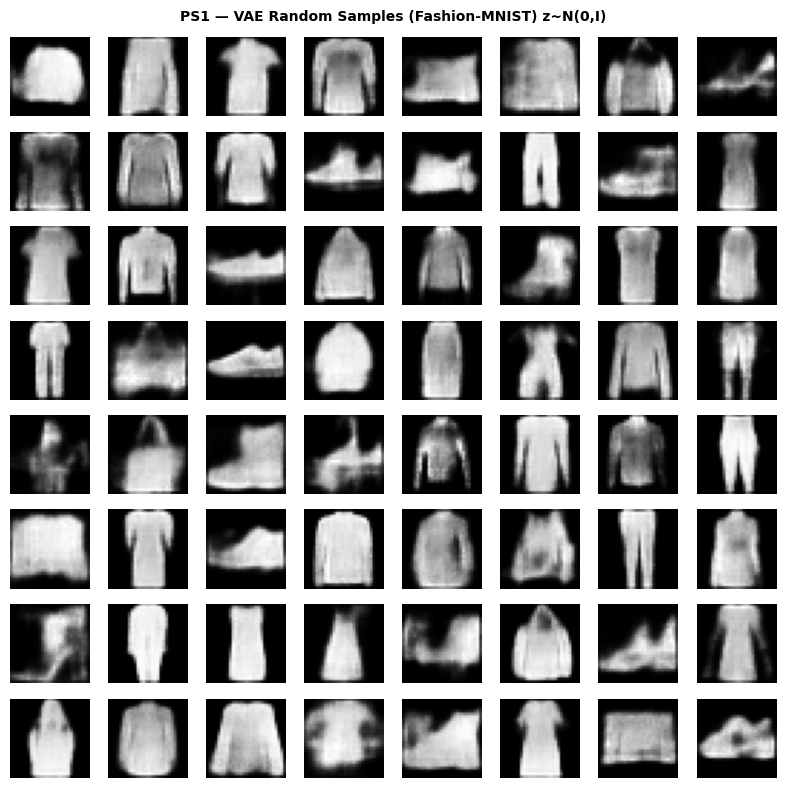

  Saved → lab6_outputs/PS1_vae_fmnist_samples.png


In [9]:
vae_emnist.eval()
with torch.no_grad():
    samples_em = vae_emnist.sample(64, device)
save_image_grid(samples_em, 'PS1 — VAE Random Samples (EMNIST) z~N(0,I)',
                'PS1_vae_emnist_samples.png')

vae_fmnist.eval()
with torch.no_grad():
    samples_fm = vae_fmnist.sample(64, device)
save_image_grid(samples_fm, 'PS1 — VAE Random Samples (Fashion-MNIST) z~N(0,I)',
                'PS1_vae_fmnist_samples.png')

### PS1 — Task 4: Latent Dimension Study (z ∈ {8, 32, 128})


=== z_dim = 8 (FashionMNIST) ===

Training VAE (z=8) on FashionMNIST z=8 for 5 epochs...
  KL annealing: β warms 0→1 over 10 epochs
  Epoch   1/5 | β=0.10 | Total=265.808  Recon=263.236  KL=25.721
  Epoch   2/5 | β=0.20 | Total=233.200  Recon=228.736  KL=22.317
  Epoch   3/5 | β=0.30 | Total=231.491  Recon=225.364  KL=20.423
  Epoch   4/5 | β=0.40 | Total=231.747  Recon=224.093  KL=19.133
  Epoch   5/5 | β=0.50 | Total=232.611  Recon=223.556  KL=18.109


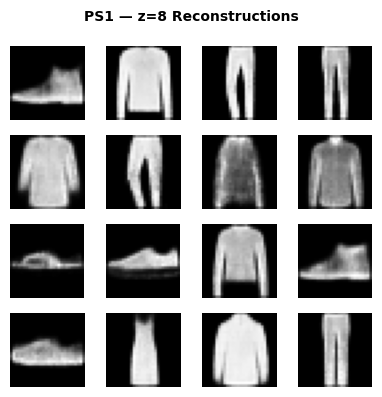

  Saved → lab6_outputs/PS1_vae_zdim8_recon.png

=== z_dim = 32 (FashionMNIST) ===

Training VAE (z=32) on FashionMNIST z=32 for 5 epochs...
  KL annealing: β warms 0→1 over 10 epochs
  Epoch   1/5 | β=0.10 | Total=270.572  Recon=266.160  KL=44.125
  Epoch   2/5 | β=0.20 | Total=238.045  Recon=230.323  KL=38.610
  Epoch   3/5 | β=0.30 | Total=235.484  Recon=226.068  KL=31.384
  Epoch   4/5 | β=0.40 | Total=234.808  Recon=224.268  KL=26.350
  Epoch   5/5 | β=0.50 | Total=234.620  Recon=223.010  KL=23.221


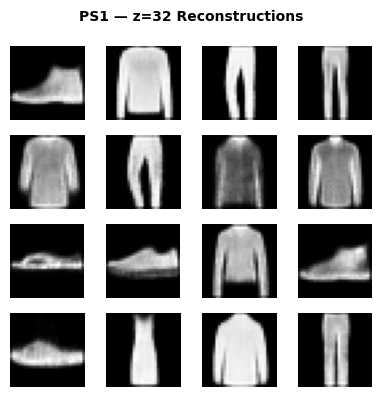

  Saved → lab6_outputs/PS1_vae_zdim32_recon.png

=== z_dim = 128 (FashionMNIST) ===

Training VAE (z=128) on FashionMNIST z=128 for 5 epochs...
  KL annealing: β warms 0→1 over 10 epochs
  Epoch   1/5 | β=0.10 | Total=274.361  Recon=269.289  KL=50.723
  Epoch   2/5 | β=0.20 | Total=241.636  Recon=233.674  KL=39.811
  Epoch   3/5 | β=0.30 | Total=237.056  Recon=228.387  KL=28.894
  Epoch   4/5 | β=0.40 | Total=235.111  Recon=225.573  KL=23.847
  Epoch   5/5 | β=0.50 | Total=234.793  Recon=224.177  KL=21.232


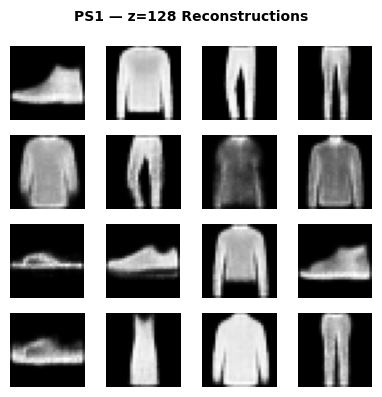

  Saved → lab6_outputs/PS1_vae_zdim128_recon.png

─── Latent Dimension Comparison Table ───
 z_dim | Recon BCE | Recon MSE |       KL |  Avg SSIM
───────────────────────────────────────────────────────
     8 |  223.5563 |   0.01421 |  18.1089 |    0.7038
    32 |  223.0101 |   0.01417 |  23.2207 |    0.7054
   128 |  224.1772 |   0.01451 |  21.2321 |    0.6970


In [10]:
from skimage.metrics import structural_similarity as ssim_fn

zdim_results = {}

for z_dim in [8, 32, 128]:
    print(f"\n=== z_dim = {z_dim} (FashionMNIST) ===")
    vae_z  = VAE(z_dim=z_dim).to(device)
    hist_z = train_vae(vae_z, loader_fm_tr, f'FashionMNIST z={z_dim}')

    vae_z.eval()
    with torch.no_grad():
        x_t, _ = next(iter(loader_fm_ts))
        x_t    = x_t[:64].to(device)
        recon_z, _, _ = vae_z(x_t)

    x_np = x_t.cpu().numpy().squeeze()
    r_np = recon_z.cpu().numpy().squeeze()
    ssim_scores = [ssim_fn(x_np[i], r_np[i], data_range=1.0) for i in range(len(x_np))]
    avg_ssim    = np.mean(ssim_scores)
    recon_mse   = F.mse_loss(recon_z, x_t).item()

    zdim_results[z_dim] = {
        'final_recon': hist_z['recon'][-1],
        'final_kl':    hist_z['kl'][-1],
        'avg_ssim':    avg_ssim,
        'recon_mse':   recon_mse,
    }
    save_image_grid(recon_z[:16], f'PS1 — z={z_dim} Reconstructions',
                    f'PS1_vae_zdim{z_dim}_recon.png', nrow=4)
    del vae_z

print("\n─── Latent Dimension Comparison Table ───")
print(f"{'z_dim':>6} | {'Recon BCE':>9} | {'Recon MSE':>9} | {'KL':>8} | {'Avg SSIM':>9}")
print("─" * 55)
for z, r in zdim_results.items():
    print(f"{z:>6} | {r['final_recon']:>9.4f} | {r['recon_mse']:>9.5f} | "
          f"{r['final_kl']:>8.4f} | {r['avg_ssim']:>9.4f}")

### PS1 — Task 5: Conditional VAE + t-SNE Visualisation

Training CVAE on Fashion-MNIST for 5 epochs...
  Epoch 1/5  Loss=271.713
  Epoch 2/5  Loss=239.014
  Epoch 3/5  Loss=235.536
  Epoch 4/5  Loss=233.937
  Epoch 5/5  Loss=233.737


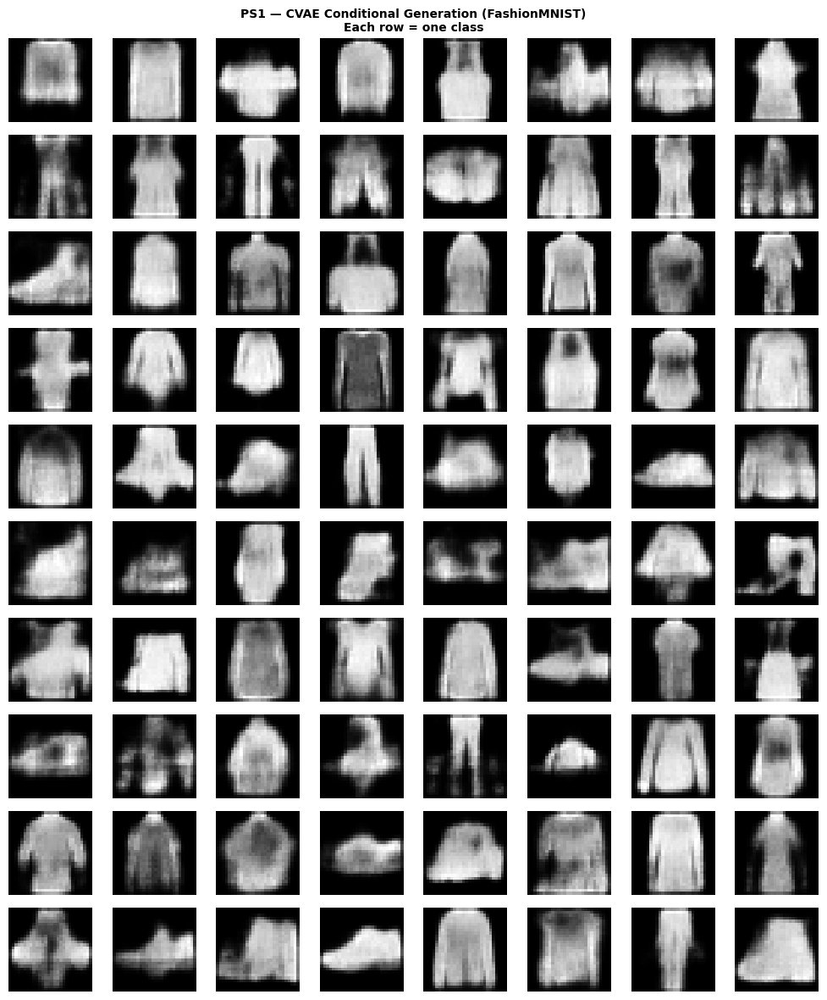

  Saved → lab6_outputs/PS1_cvae_class_generation.png


In [11]:
# ── Conditional VAE (CVAE) ────────────────────────────────────
class CVAE(nn.Module):
    def __init__(self, z_dim=32, num_classes=10):
        super().__init__()
        self.z_dim = z_dim
        self.num_classes = num_classes
        self.encoder = Encoder(z_dim)
        self.decoder = Decoder(z_dim + num_classes)

    def reparameterize(self, mu, logvar):
        return mu + torch.randn_like(mu) * torch.exp(0.5 * logvar)

    def forward(self, x, y):
        mu, logvar = self.encoder(x)
        z          = self.reparameterize(mu, logvar)
        y_oh       = F.one_hot(y, self.num_classes).float().to(z.device)
        return self.decoder(torch.cat([z, y_oh], dim=1)), mu, logvar

    def generate(self, y_class, n, device):
        z    = torch.randn(n, self.z_dim, device=device)
        y_oh = F.one_hot(torch.full((n,), y_class, dtype=torch.long),
                         self.num_classes).float().to(device)
        return self.decoder(torch.cat([z, y_oh], dim=1))


# Train CVAE on Fashion-MNIST
cvae     = CVAE(z_dim=32, num_classes=FM_CLASSES).to(device)
opt_cvae = optim.Adam(cvae.parameters(), lr=LR_VAE)

print(f"Training CVAE on Fashion-MNIST for {EPOCHS} epochs...")
for epoch in range(1, EPOCHS + 1):
    cvae.train(); t_loss = 0.0
    beta = min(1.0, epoch / 10)
    for x, y in loader_fm_tr:
        x, y = x.to(device), y.to(device)
        opt_cvae.zero_grad()
        recon, mu, lv = cvae(x, y)
        loss, _, _    = vae_loss(recon, x, mu, lv, beta)
        loss.backward(); opt_cvae.step()
        t_loss += loss.item()
    print(f"  Epoch {epoch}/{EPOCHS}  Loss={t_loss/len(loader_fm_tr):.3f}")

# Class-conditioned generation grid
cvae.eval()
fig, axes = plt.subplots(FM_CLASSES, 8, figsize=(10, FM_CLASSES * 1.2))
for cls in range(FM_CLASSES):
    with torch.no_grad():
        imgs = cvae.generate(cls, 8, device).cpu().squeeze()
    for j, ax in enumerate(axes[cls]):
        ax.imshow(imgs[j].numpy(), cmap='gray'); ax.axis('off')
    axes[cls, 0].set_ylabel(FM_LABELS[cls], fontsize=7, rotation=0, labelpad=50, va='center')
fig.suptitle('PS1 — CVAE Conditional Generation (FashionMNIST)\nEach row = one class',
             fontweight='bold', fontsize=10)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS1_cvae_class_generation.png')
plt.savefig(path, dpi=120, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

Running t-SNE on VAE latent space (FashionMNIST)...


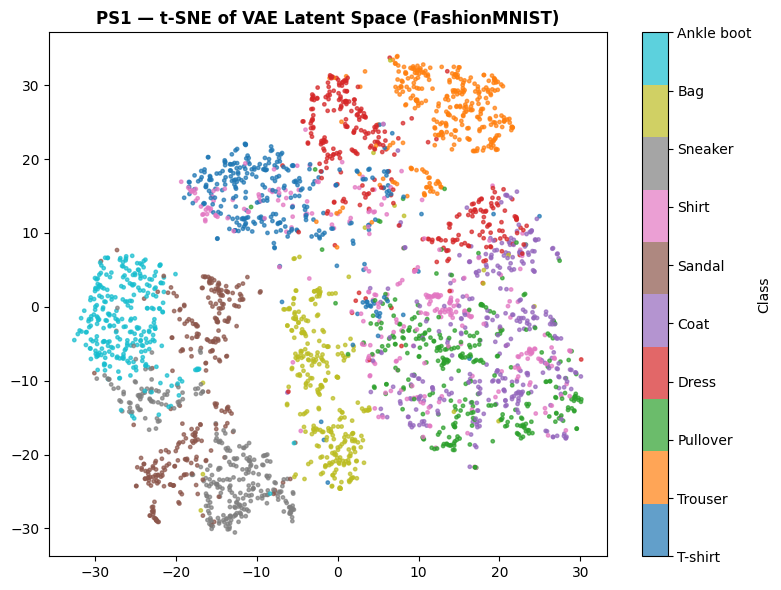

  Saved → lab6_outputs/PS1_vae_tsne.png


In [12]:
# ── t-SNE of VAE latent space ─────────────────────────────────
print("Running t-SNE on VAE latent space (FashionMNIST)...")
vae_fmnist.eval()
z_list, y_list = [], []
with torch.no_grad():
    for x, y in DataLoader(fmnist_test_01, batch_size=512):
        mu, _ = vae_fmnist.encoder(x.to(device))
        z_list.append(mu.cpu().numpy())
        y_list.append(y.numpy())
        if sum(len(a) for a in z_list) >= 3000: break

Z = np.concatenate(z_list)[:3000]
Y = np.concatenate(y_list)[:3000]

tsne = TSNE(n_components=2, random_state=SEED, perplexity=30, max_iter=500)
emb  = tsne.fit_transform(Z)

fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter(emb[:,0], emb[:,1], c=Y, cmap='tab10', s=6, alpha=0.7)
cbar = plt.colorbar(sc, ax=ax, label='Class')
cbar.set_ticks(range(FM_CLASSES))
cbar.set_ticklabels(FM_LABELS)
ax.set_title('PS1 — t-SNE of VAE Latent Space (FashionMNIST)', fontweight='bold')
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS1_vae_tsne.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

---
# 🟢 Problem Statement 2: Vanilla GAN

**Objective:** Implement the original Goodfellow et al. (2014) GAN framework.

### Architecture Summary
| Component | Design |
|-----------|--------|
| Generator | z(100) → FC(256→512→1024→784) → Tanh → reshape 28×28 |
| Discriminator | Flatten(784) → FC(1024→512→256→1) → Sigmoid |
| Activations | LeakyReLU(0.2) in both; Dropout(0.3) in D |
| Training | 1 D-step then 1 G-step; label smoothing real=0.9, fake=0.0 |
| Objective | Non-saturating: G maximises log D(G(z)) |

### Tasks
6. Train on EMNIST & FashionMNIST, generate image grids every 5 epochs
7. Mode Collapse Detection
8. Training Instability Analysis (loss curves)
9. Effect of Noise Dimension z ∈ {50, 100, 200}
10. Gradient Penalty Study (λ=10)

### PS2 — Vanilla GAN Architecture

In [13]:
class Generator(nn.Module):
    """FC Generator: z(100) → 28×28 image with Tanh."""
    def __init__(self, z_dim=Z_DIM_GAN):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 256),  nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256,   512),  nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512,  1024),  nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024,  784),  nn.Tanh(),
        )

    def forward(self, z):
        return self.net(z).view(-1, 1, 28, 28)


class Discriminator(nn.Module):
    """FC Discriminator: 28×28 image → scalar probability."""
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(784, 1024), nn.LeakyReLU(0.2, inplace=True), nn.Dropout(0.3),
            nn.Linear(1024, 512), nn.LeakyReLU(0.2, inplace=True), nn.Dropout(0.3),
            nn.Linear(512,  256), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256,    1), nn.Sigmoid(),
        )

    def forward(self, x):
        return self.net(x)


_G = Generator(); _D = Discriminator()
_z = torch.randn(4, Z_DIM_GAN)
_f = _G(_z)
print(f"G output : {list(_f.shape)}")
print(f"D output : {list(_D(_f).shape)}")
del _G, _D, _z, _f
print("Vanilla GAN architectures ready ✓")

G output : [4, 1, 28, 28]
D output : [4, 1]
Vanilla GAN architectures ready ✓


### PS2 — Training Loop


Training Vanilla GAN on FashionMNIST for 5 epochs...
  Epoch   1/5 | D=0.7981  G=2.9227
  Epoch   2/5 | D=0.8486  G=2.7577
  Epoch   3/5 | D=0.9287  G=2.3178
  Epoch   4/5 | D=0.9872  G=2.0174
  Epoch   5/5 | D=0.9955  G=1.9563


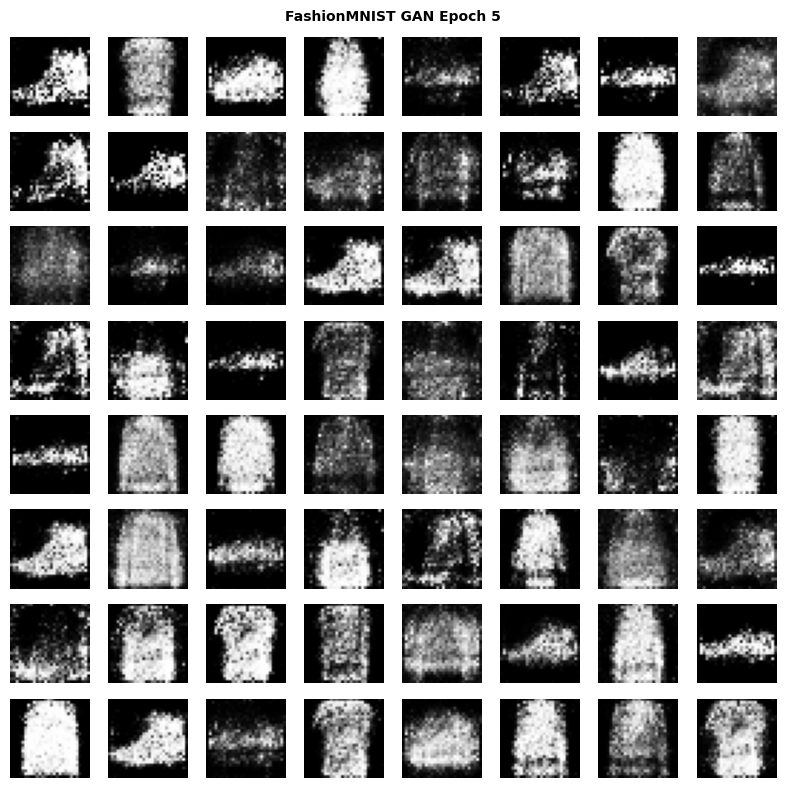

  Saved → lab6_outputs/PS2_gan_fmnist_epoch005.png


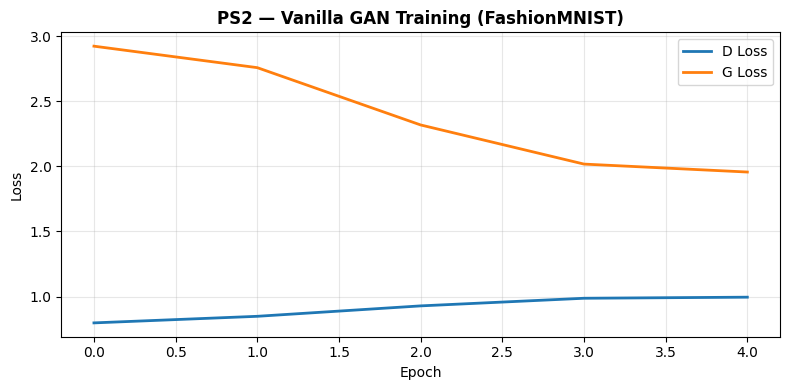

  Saved → lab6_outputs/PS2_gan_fmnist_loss.png


In [14]:
def train_gan(G, D, train_loader, dataset_name='Dataset',
              epochs=EPOCHS, lr=LR_GAN, z_dim=Z_DIM_GAN,
              save_every=5, fname_prefix='PS2_gan'):
    """
    Minimax GAN training (non-saturating G update).
    Label smoothing: real=0.9, fake=0.0.
    Saves sample grid every save_every epochs.
    """
    criterion = nn.BCELoss()
    opt_D = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_G = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
    hist  = {'D_loss':[], 'G_loss':[]}
    fixed_z = torch.randn(64, z_dim, device=device)

    print(f"\nTraining Vanilla GAN on {dataset_name} for {epochs} epochs...")
    for epoch in range(1, epochs + 1):
        G.train(); D.train()
        d_ep = g_ep = 0.0

        for real, _ in train_loader:
            real = real.to(device)
            bs   = real.size(0)
            real_lbl = torch.full((bs, 1), 0.9, device=device)
            fake_lbl = torch.zeros(bs, 1, device=device)

            # D step
            z    = torch.randn(bs, z_dim, device=device)
            fake = G(z).detach()
            opt_D.zero_grad()
            loss_D = criterion(D(real), real_lbl) + criterion(D(fake), fake_lbl)
            loss_D.backward(); opt_D.step()
            d_ep += loss_D.item()

            # G step (non-saturating)
            z    = torch.randn(bs, z_dim, device=device)
            fake = G(z)
            opt_G.zero_grad()
            loss_G = criterion(D(fake), torch.ones(bs, 1, device=device))
            loss_G.backward(); opt_G.step()
            g_ep += loss_G.item()

        hist['D_loss'].append(d_ep / len(train_loader))
        hist['G_loss'].append(g_ep / len(train_loader))
        print(f"  Epoch {epoch:>3}/{epochs} | D={hist['D_loss'][-1]:.4f}  G={hist['G_loss'][-1]:.4f}")

        if epoch % save_every == 0 or epoch == epochs:
            G.eval()
            with torch.no_grad():
                prog = G(fixed_z)
            save_image_grid(prog, f'{dataset_name} GAN Epoch {epoch}',
                            f'{fname_prefix}_epoch{epoch:03d}.png', denorm=True)
            G.train()
    return hist


# Train on FashionMNIST
loader_fm11_tr = make_loader(fmnist_train_11)
G_fm = Generator().to(device)
D_fm = Discriminator().to(device)

hist_gan_fm = train_gan(G_fm, D_fm, loader_fm11_tr, 'FashionMNIST',
                        fname_prefix=f'{OUT_DIR}/PS2_gan_fmnist')
plot_losses({'D Loss': hist_gan_fm['D_loss'], 'G Loss': hist_gan_fm['G_loss']},
            'PS2 — Vanilla GAN Training (FashionMNIST)', 'PS2_gan_fmnist_loss.png')


Training Vanilla GAN on EMNIST for 5 epochs...
  Epoch   1/5 | D=0.6937  G=4.2698
  Epoch   2/5 | D=0.5286  G=5.1333
  Epoch   3/5 | D=0.5648  G=3.8921
  Epoch   4/5 | D=0.6463  G=3.4087
  Epoch   5/5 | D=0.7507  G=2.9185


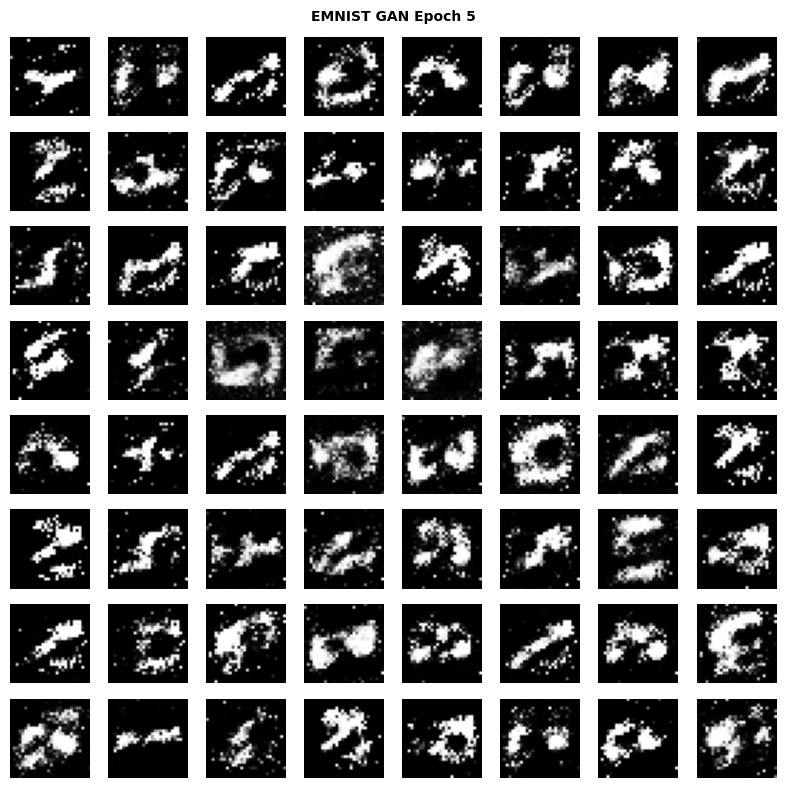

  Saved → lab6_outputs/PS2_gan_emnist_epoch005.png


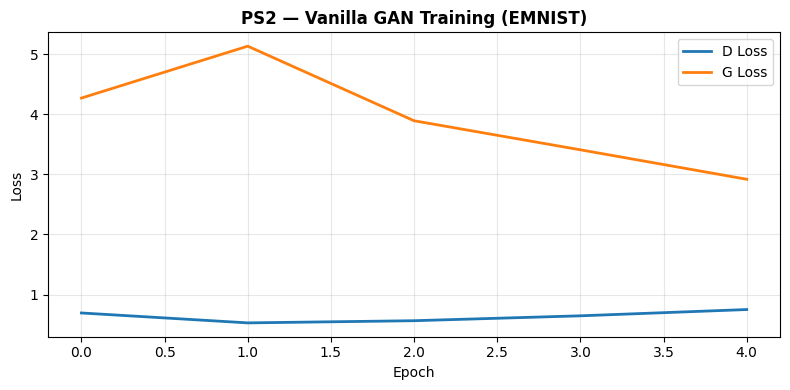

  Saved → lab6_outputs/PS2_gan_emnist_loss.png


In [15]:
# Train on EMNIST
loader_em11_tr = make_loader(emnist_train_11)
G_em = Generator().to(device)
D_em = Discriminator().to(device)

hist_gan_em = train_gan(G_em, D_em, loader_em11_tr, 'EMNIST',
                        fname_prefix=f'{OUT_DIR}/PS2_gan_emnist')
plot_losses({'D Loss': hist_gan_em['D_loss'], 'G Loss': hist_gan_em['G_loss']},
            'PS2 — Vanilla GAN Training (EMNIST)', 'PS2_gan_emnist_loss.png')

### PS2 — Task 7: Mode Collapse Detection


--- Task 7: Mode Collapse Detection ---
Pixel Variance across 100 samples: 0.073025
Interpretation: DIVERSE (no mode collapse)


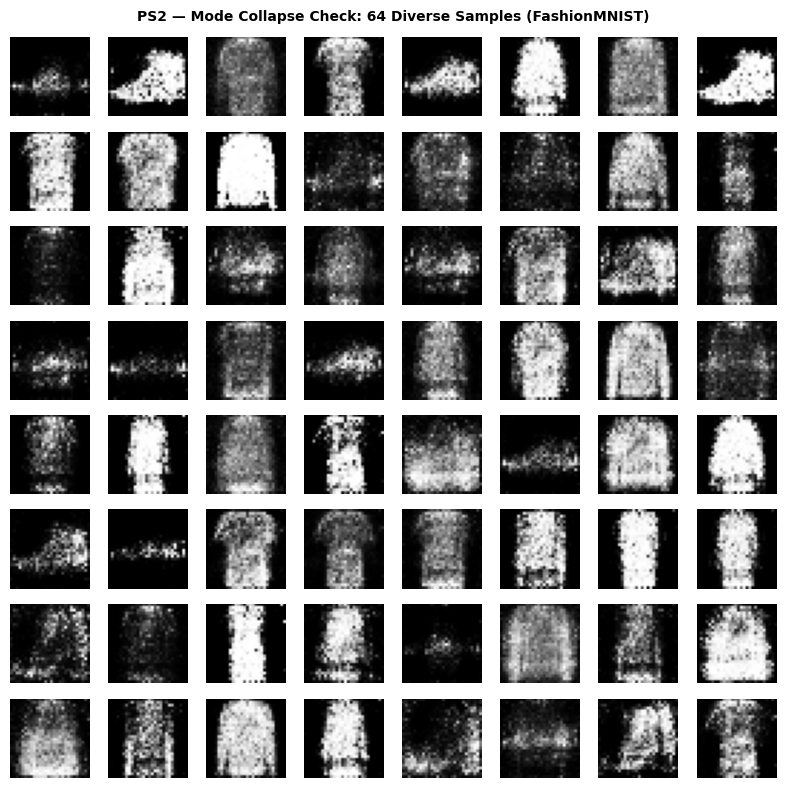

  Saved → lab6_outputs/PS2_gan_mode_collapse_check.png


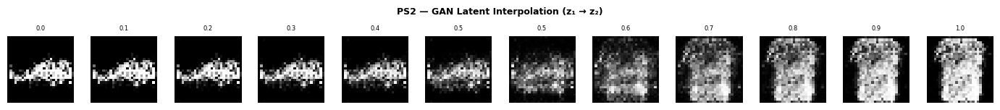

  Saved → lab6_outputs/PS2_gan_latent_interp.png


In [16]:
# Task 7: Mode Collapse Detection
# Generate 100 samples — measure pixel variance (higher = more diverse)
G_fm.eval()
with torch.no_grad():
    mc_imgs = G_fm(torch.randn(100, Z_DIM_GAN, device=device))

mc_np = (mc_imgs.cpu().numpy() * 0.5 + 0.5).clip(0, 1)
pixel_var = float(np.var(mc_np, axis=0).mean())
print(f"\n--- Task 7: Mode Collapse Detection ---")
print(f"Pixel Variance across 100 samples: {pixel_var:.6f}")
print(f"Interpretation: {'DIVERSE (no mode collapse)' if pixel_var > 0.01 else 'LOW DIVERSITY — possible mode collapse'}")

save_image_grid(mc_imgs[:64], 'PS2 — Mode Collapse Check: 64 Diverse Samples (FashionMNIST)',
                'PS2_gan_mode_collapse_check.png', denorm=True)

# Latent interpolation (z1 → z2)
z1 = torch.randn(1, Z_DIM_GAN, device=device)
z2 = torch.randn(1, Z_DIM_GAN, device=device)
interp_row = []
for alpha in np.linspace(0, 1, 12):
    z_mid = (1-alpha)*z1 + alpha*z2
    with torch.no_grad():
        interp_row.append(G_fm(z_mid).cpu())

interp_imgs = torch.cat(interp_row)
fig, axes = plt.subplots(1, 12, figsize=(14, 1.5))
for i, ax in enumerate(axes):
    ax.imshow((interp_imgs[i].squeeze()*0.5+0.5).clamp(0,1).numpy(), cmap='gray')
    ax.axis('off'); ax.set_title(f'{i/11:.1f}', fontsize=6)
fig.suptitle('PS2 — GAN Latent Interpolation (z₁ → z₂)', fontweight='bold', fontsize=9)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS2_gan_latent_interp.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

### PS2 — Task 8: Training Instability Analysis

In [17]:
# Task 8: Training Instability Analysis — Oscillation Detection
print("\n--- Task 8: Training Instability Analysis ---")
d_losses = hist_gan_fm['D_loss']
g_losses = hist_gan_fm['G_loss']

if len(d_losses) > 2:
    d_diff = np.diff(d_losses)
    g_diff = np.diff(g_losses)
    d_osc  = float(np.std(d_diff))
    g_osc  = float(np.std(g_diff))
    print(f"D-loss oscillation (std of Δ): {d_osc:.4f}")
    print(f"G-loss oscillation (std of Δ): {g_osc:.4f}")
    print(f"D-loss range: [{min(d_losses):.4f}, {max(d_losses):.4f}]")
    print(f"G-loss range: [{min(g_losses):.4f}, {max(g_losses):.4f}]")
    print("Stability: " + ("UNSTABLE — high oscillation" if d_osc > 0.1 else "Relatively stable"))
else:
    print("Need more epochs for meaningful oscillation analysis.")


--- Task 8: Training Instability Analysis ---
D-loss oscillation (std of Δ): 0.0260
G-loss oscillation (std of Δ): 0.1425
D-loss range: [0.7981, 0.9955]
G-loss range: [1.9563, 2.9227]
Stability: Relatively stable


### PS2 — Task 9: Effect of Noise Dimension (z ∈ {50, 100, 200})


=== GAN with z_dim=50 (FashionMNIST) ===

Training Vanilla GAN on FashionMNIST(z=50) for 5 epochs...
  Epoch   1/5 | D=0.8659  G=2.6075
  Epoch   2/5 | D=0.8822  G=2.6074
  Epoch   3/5 | D=0.9678  G=2.1453
  Epoch   4/5 | D=0.9812  G=2.0161
  Epoch   5/5 | D=1.0473  G=1.7481


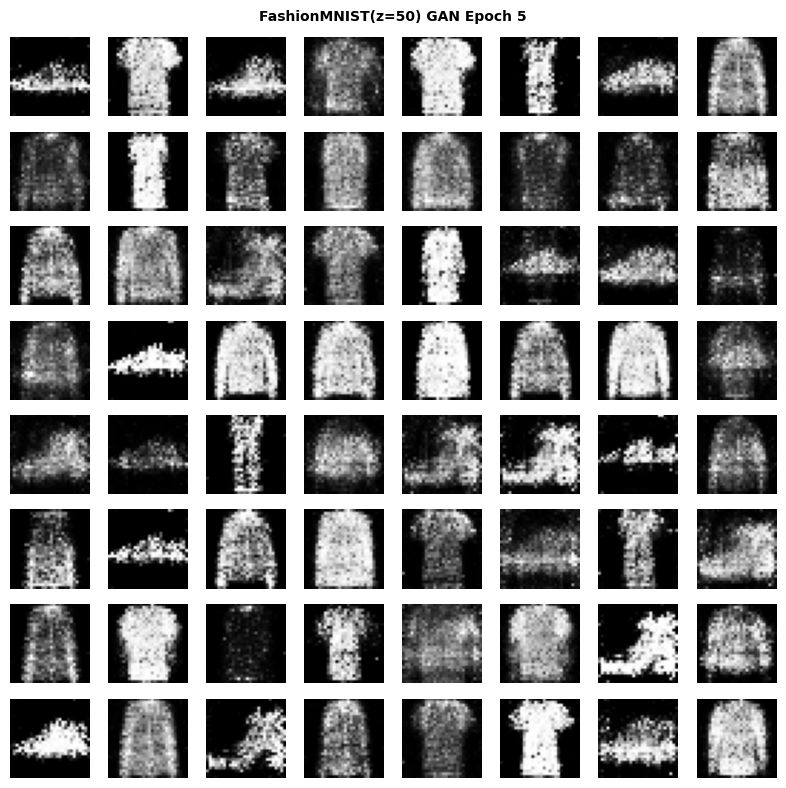

  Saved → lab6_outputs/PS2_gan_zdim50_epoch005.png


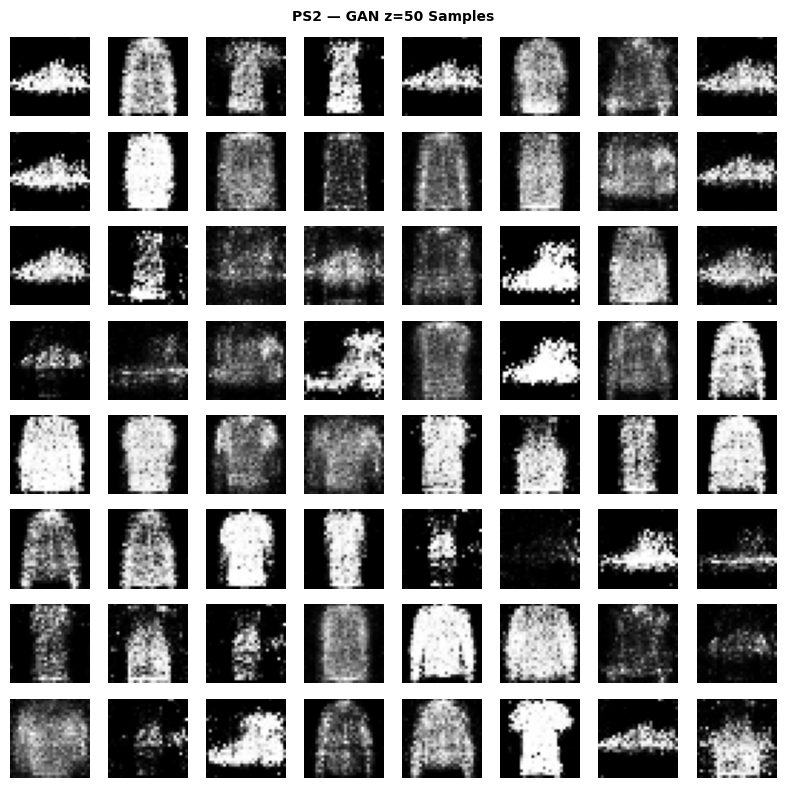

  Saved → lab6_outputs/PS2_gan_zdim50_samples.png

=== GAN with z_dim=100 (FashionMNIST) ===

Training Vanilla GAN on FashionMNIST(z=100) for 5 epochs...
  Epoch   1/5 | D=0.7961  G=2.8417
  Epoch   2/5 | D=0.8401  G=2.6653
  Epoch   3/5 | D=0.9077  G=2.2803
  Epoch   4/5 | D=0.9784  G=2.0841
  Epoch   5/5 | D=0.9977  G=1.9620


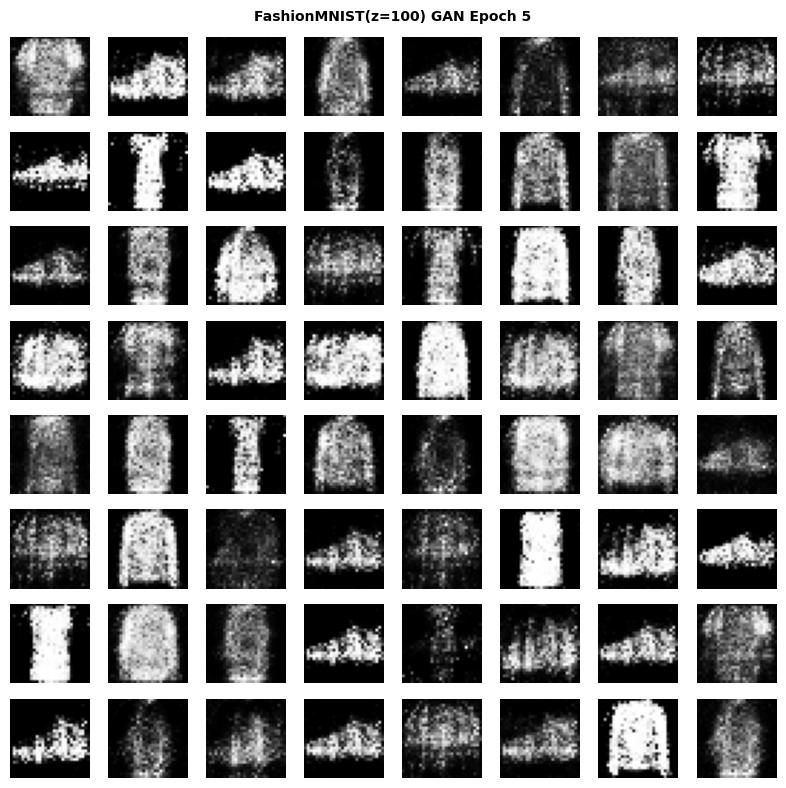

  Saved → lab6_outputs/PS2_gan_zdim100_epoch005.png


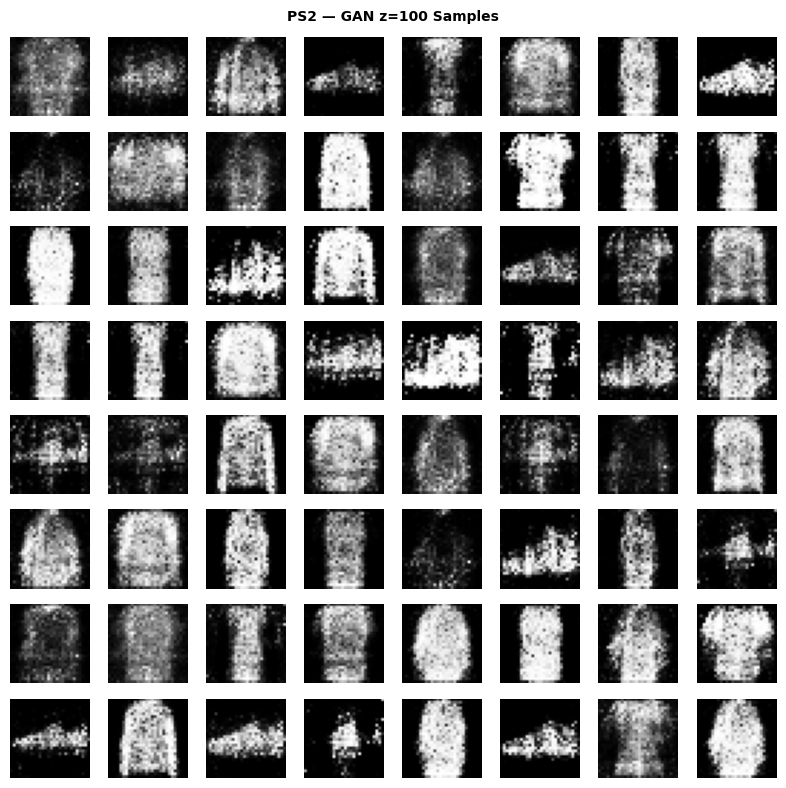

  Saved → lab6_outputs/PS2_gan_zdim100_samples.png

=== GAN with z_dim=200 (FashionMNIST) ===

Training Vanilla GAN on FashionMNIST(z=200) for 5 epochs...
  Epoch   1/5 | D=0.7476  G=3.2557
  Epoch   2/5 | D=0.7914  G=3.0839
  Epoch   3/5 | D=0.8650  G=2.5534
  Epoch   4/5 | D=0.9163  G=2.2140
  Epoch   5/5 | D=0.9487  G=2.1123


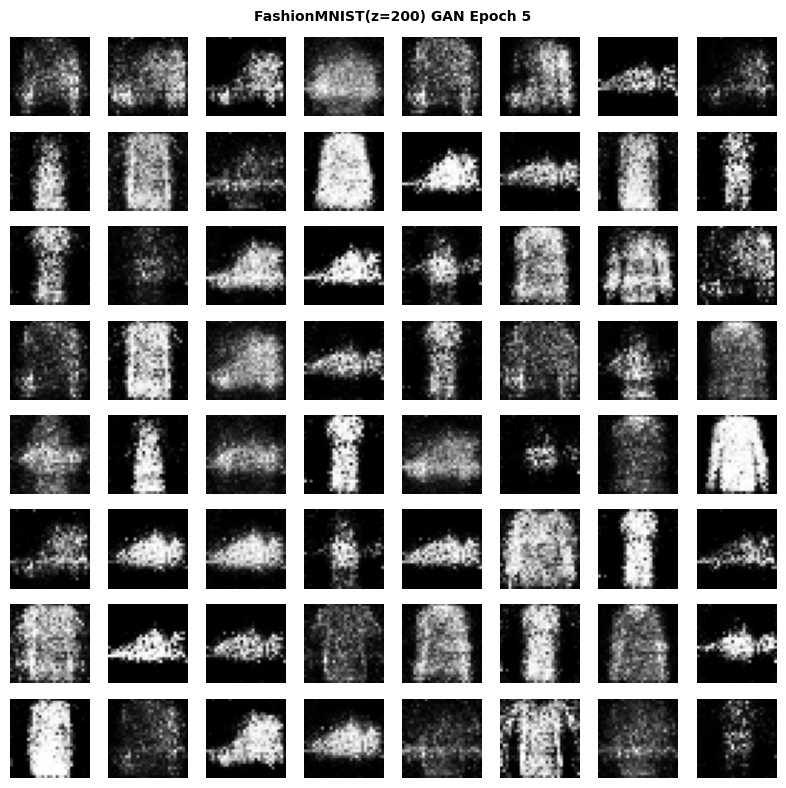

  Saved → lab6_outputs/PS2_gan_zdim200_epoch005.png


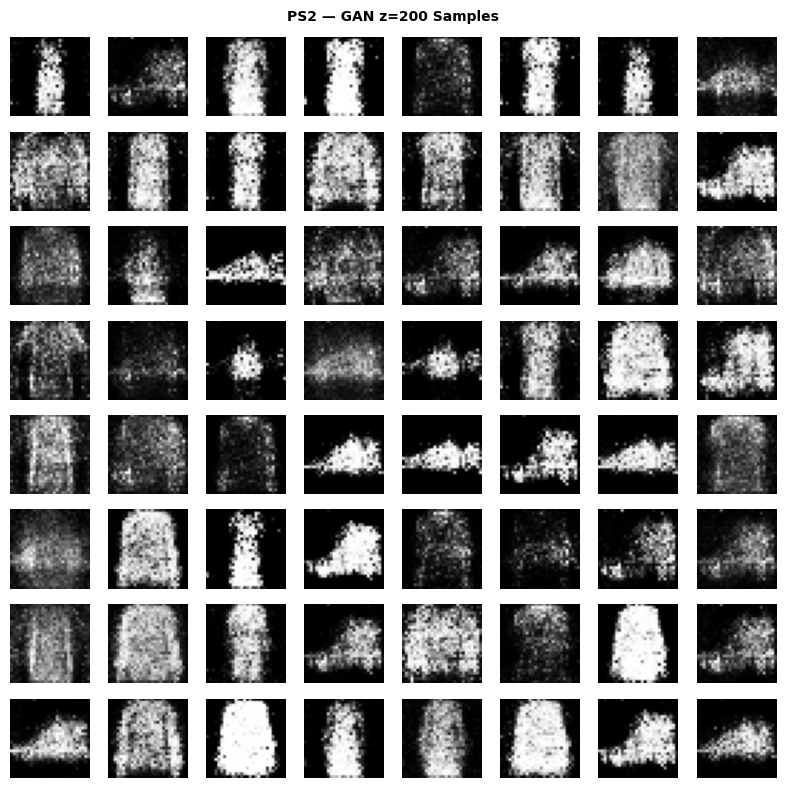

  Saved → lab6_outputs/PS2_gan_zdim200_samples.png

─── Noise Dimension Comparison Table ───
 z_dim |  D Loss |  G Loss |  Pixel Var
──────────────────────────────────────
    50 |  1.0473 |  1.7481 |   0.078728
   100 |  0.9977 |  1.9620 |   0.074516
   200 |  0.9487 |  2.1123 |   0.072711


In [18]:
# Task 9: Noise Dimension Comparison
zdim_gan_results = {}

for z_dim_exp in [50, 100, 200]:
    print(f"\n=== GAN with z_dim={z_dim_exp} (FashionMNIST) ===")
    G_exp = Generator(z_dim=z_dim_exp).to(device)
    D_exp = Discriminator().to(device)
    hist_exp = train_gan(G_exp, D_exp, loader_fm11_tr, f'FashionMNIST(z={z_dim_exp})',
                         z_dim=z_dim_exp, fname_prefix=f'{OUT_DIR}/PS2_gan_zdim{z_dim_exp}')

    G_exp.eval()
    with torch.no_grad():
        test_imgs = G_exp(torch.randn(100, z_dim_exp, device=device))
    test_np = (test_imgs.cpu().numpy()*0.5+0.5).clip(0,1)
    pv = float(np.var(test_np, axis=0).mean())

    zdim_gan_results[z_dim_exp] = {
        'final_D': hist_exp['D_loss'][-1],
        'final_G': hist_exp['G_loss'][-1],
        'pixel_var': pv,
    }
    save_image_grid(test_imgs[:64], f'PS2 — GAN z={z_dim_exp} Samples',
                    f'PS2_gan_zdim{z_dim_exp}_samples.png', denorm=True)
    del G_exp, D_exp

print("\n─── Noise Dimension Comparison Table ───")
print(f"{'z_dim':>6} | {'D Loss':>7} | {'G Loss':>7} | {'Pixel Var':>10}")
print("─" * 38)
for z, r in zdim_gan_results.items():
    print(f"{z:>6} | {r['final_D']:>7.4f} | {r['final_G']:>7.4f} | {r['pixel_var']:>10.6f}")

### PS2 — Task 10: Gradient Penalty Study (λ=10)


Training GAN+GP (λ=10) on FashionMNIST for 5 epochs...
  Epoch   1/5 | D=7.9017  G=1.5872
  Epoch   2/5 | D=3.9913  G=1.2061
  Epoch   3/5 | D=2.1507  G=1.0841


python(43767) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43768) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   4/5 | D=1.7627  G=1.1967


python(43772) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43773) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   5/5 | D=1.3995  G=1.2218


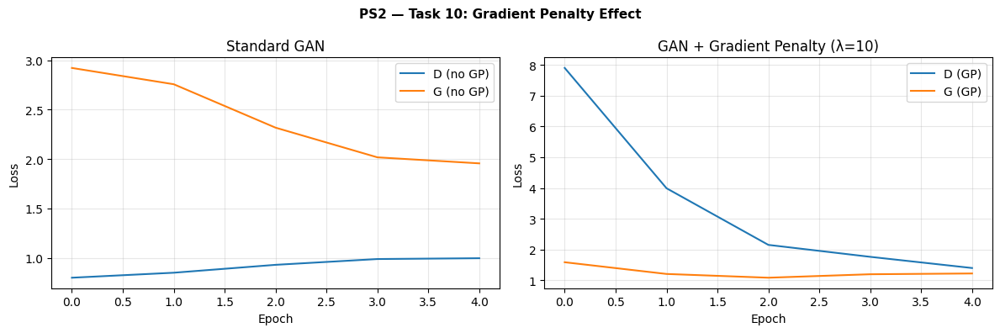

  Saved → lab6_outputs/PS2_gan_gp_comparison.png


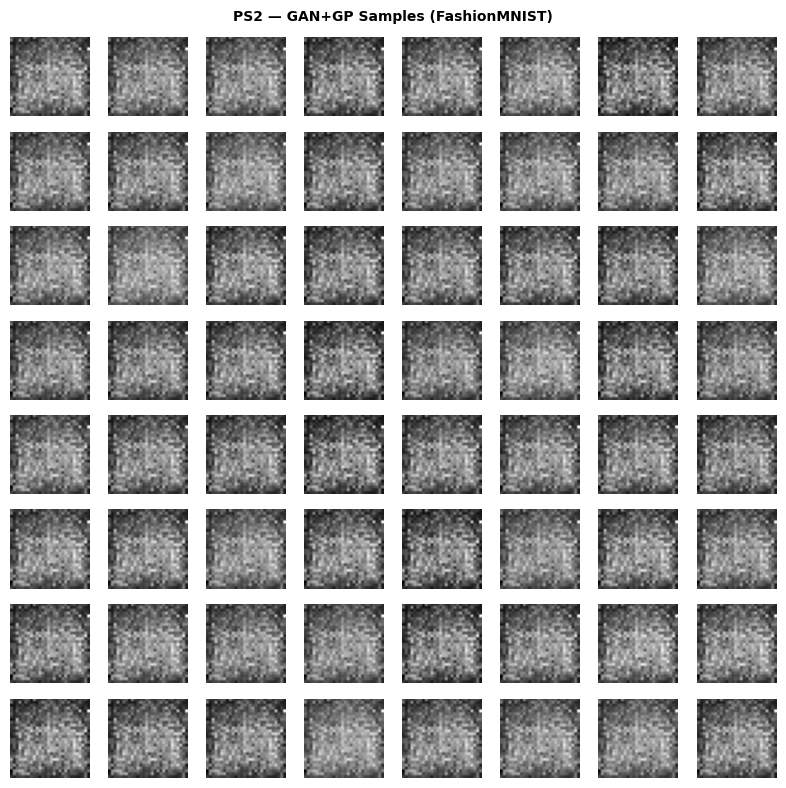

  Saved → lab6_outputs/PS2_gan_gp_samples.png


In [19]:
# Task 10: Gradient Penalty (GP) — compare standard GAN vs GP-GAN
def compute_gradient_penalty(D, real, fake, device, lambda_gp=10):
    """Compute gradient penalty for WGAN-GP-style regularisation."""
    bs    = real.size(0)
    alpha = torch.rand(bs, 1, 1, 1, device=device)
    interp = (alpha * real + (1 - alpha) * fake).requires_grad_(True)
    d_interp = D(interp)
    grads = torch.autograd.grad(
        outputs=d_interp, inputs=interp,
        grad_outputs=torch.ones_like(d_interp),
        create_graph=True, retain_graph=True, only_inputs=True
    )[0]
    grads = grads.view(bs, -1)
    gp = ((grads.norm(2, dim=1) - 1) ** 2).mean()
    return lambda_gp * gp


def train_gan_gp(G, D, train_loader, dataset_name='Dataset',
                  epochs=EPOCHS, lr=LR_GAN, z_dim=Z_DIM_GAN,
                  lambda_gp=10, fname_prefix='PS2_gan_gp'):
    """GAN training WITH gradient penalty on D."""
    opt_D = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_G = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
    criterion = nn.BCELoss()
    hist = {'D_loss':[], 'G_loss':[]}
    fixed_z = torch.randn(64, z_dim, device=device)

    print(f"\nTraining GAN+GP (λ={lambda_gp}) on {dataset_name} for {epochs} epochs...")
    for epoch in range(1, epochs + 1):
        G.train(); D.train()
        d_ep = g_ep = 0.0
        for real, _ in train_loader:
            real = real.to(device)
            bs   = real.size(0)
            z    = torch.randn(bs, z_dim, device=device)
            fake = G(z).detach()

            opt_D.zero_grad()
            real_lbl = torch.full((bs, 1), 0.9, device=device)
            fake_lbl = torch.zeros(bs, 1, device=device)
            loss_D = (criterion(D(real), real_lbl) + criterion(D(fake), fake_lbl)
                      + compute_gradient_penalty(D, real, fake, device, lambda_gp))
            loss_D.backward(); opt_D.step()
            d_ep += loss_D.item()

            z    = torch.randn(bs, z_dim, device=device)
            fake = G(z)
            opt_G.zero_grad()
            loss_G = criterion(D(fake), torch.ones(bs, 1, device=device))
            loss_G.backward(); opt_G.step()
            g_ep += loss_G.item()

        hist['D_loss'].append(d_ep / len(train_loader))
        hist['G_loss'].append(g_ep / len(train_loader))
        print(f"  Epoch {epoch:>3}/{epochs} | D={hist['D_loss'][-1]:.4f}  G={hist['G_loss'][-1]:.4f}")

    return hist


G_gp = Generator().to(device)
D_gp = Discriminator().to(device)

hist_gp = train_gan_gp(G_gp, D_gp, loader_fm11_tr, 'FashionMNIST',
                        fname_prefix=f'{OUT_DIR}/PS2_gan_gp')

# Compare loss curves: standard GAN vs GP GAN
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(hist_gan_fm['D_loss'], label='D (no GP)'); ax1.plot(hist_gan_fm['G_loss'], label='G (no GP)')
ax1.set_title('Standard GAN'); ax1.legend(); ax1.grid(True, alpha=0.3)
ax2.plot(hist_gp['D_loss'], label='D (GP)'); ax2.plot(hist_gp['G_loss'], label='G (GP)')
ax2.set_title(f'GAN + Gradient Penalty (λ=10)'); ax2.legend(); ax2.grid(True, alpha=0.3)
for ax in (ax1, ax2): ax.set_xlabel('Epoch'); ax.set_ylabel('Loss')
fig.suptitle('PS2 — Task 10: Gradient Penalty Effect', fontweight='bold', fontsize=11)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS2_gan_gp_comparison.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

G_gp.eval()
with torch.no_grad():
    gp_samples = G_gp(torch.randn(64, Z_DIM_GAN, device=device))
save_image_grid(gp_samples, 'PS2 — GAN+GP Samples (FashionMNIST)',
                'PS2_gan_gp_samples.png', denorm=True)
del G_gp, D_gp

---
# 🟡 Problem Statement 3: Conditional GAN (CGAN)

**Objective:** Class-conditioned image generation by feeding label information to both G and D.

### Architecture Summary
| Component | Design |
|-----------|--------|
| Generator | z(100) ⊕ one-hot(num_classes) → FC layers → Tanh |
| Discriminator | Flatten(img) ⊕ one-hot(num_classes) → FC layers → Sigmoid |
| Conditioning | One-hot class label concatenated at input of both G and D |

### Tasks
11. Class-Specific Generation (5×5 grid per class)
12. Label Interpolation (blend one-hot vectors)
13. Mismatched Label Attack
14. Cross-Dataset Transfer (brief)
15. Intra-Class Diversity Measurement

### PS3 — CGAN Architecture

In [20]:
class CGenerator(nn.Module):
    """Conditional Generator: z ⊕ one-hot(c) → 28×28 image."""
    def __init__(self, z_dim=Z_DIM_GAN, num_classes=10):
        super().__init__()
        self.z_dim       = z_dim
        self.num_classes = num_classes
        inp = z_dim + num_classes
        self.net = nn.Sequential(
            nn.Linear(inp, 256),  nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256,  512), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024,  784), nn.Tanh(),
        )

    def forward(self, z, y):
        y_oh = F.one_hot(y, self.num_classes).float().to(z.device)
        return self.net(torch.cat([z, y_oh], dim=1)).view(-1, 1, 28, 28)


class CDiscriminator(nn.Module):
    """Conditional Discriminator: flatten(img) ⊕ one-hot(c) → P(real)."""
    def __init__(self, num_classes=10):
        super().__init__()
        self.num_classes = num_classes
        inp = 784 + num_classes
        self.net = nn.Sequential(
            nn.Linear(inp, 1024), nn.LeakyReLU(0.2, inplace=True), nn.Dropout(0.3),
            nn.Linear(1024, 512), nn.LeakyReLU(0.2, inplace=True), nn.Dropout(0.3),
            nn.Linear(512,  256), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256,    1), nn.Sigmoid(),
        )

    def forward(self, x, y):
        y_oh = F.one_hot(y, self.num_classes).float().to(x.device)
        return self.net(torch.cat([x.flatten(1), y_oh], dim=1))


print("CGAN architectures ready ✓")

CGAN architectures ready ✓


### PS3 — CGAN Training Loop


Training CGAN on FashionMNIST for 5 epochs...


python(43810) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43811) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/5 | D=0.7599  G=3.4206


python(43830) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43831) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/5 | D=0.7681  G=3.2305


python(43834) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43835) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/5 | D=0.8078  G=3.0407


python(43840) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43841) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   4/5 | D=0.8690  G=2.7096


python(43845) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43846) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   5/5 | D=0.9296  G=2.2479


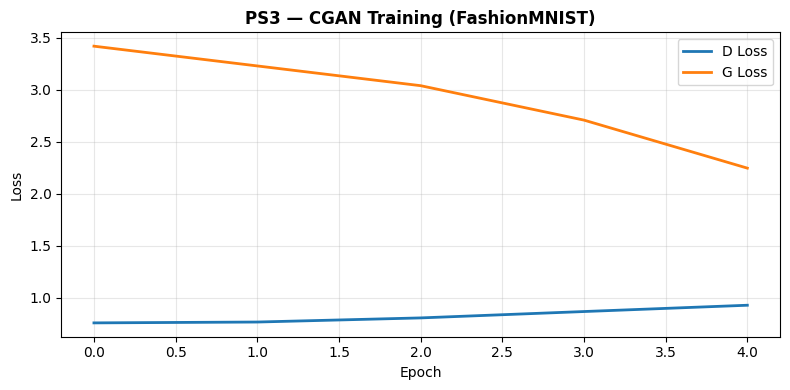

  Saved → lab6_outputs/PS3_cgan_fmnist_loss.png


In [21]:
def train_cgan(CG, CD, train_loader, num_classes, dataset_name='Dataset',
               epochs=EPOCHS, lr=LR_GAN, z_dim=Z_DIM_GAN, fname_prefix='PS3_cgan'):
    criterion = nn.BCELoss()
    opt_D = optim.Adam(CD.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_G = optim.Adam(CG.parameters(), lr=lr, betas=(0.5, 0.999))
    hist  = {'D_loss':[], 'G_loss':[]}

    print(f"\nTraining CGAN on {dataset_name} for {epochs} epochs...")
    for epoch in range(1, epochs + 1):
        CG.train(); CD.train()
        d_ep = g_ep = 0.0
        for real, labels in train_loader:
            real   = real.to(device)
            labels = labels.to(device)
            bs = real.size(0)
            real_lbl = torch.full((bs, 1), 0.9, device=device)
            fake_lbl = torch.zeros(bs, 1, device=device)

            z    = torch.randn(bs, z_dim, device=device)
            fake = CG(z, labels).detach()
            opt_D.zero_grad()
            loss_D = (criterion(CD(real, labels), real_lbl) +
                      criterion(CD(fake, labels), fake_lbl))
            loss_D.backward(); opt_D.step()
            d_ep += loss_D.item()

            z    = torch.randn(bs, z_dim, device=device)
            fake = CG(z, labels)
            opt_G.zero_grad()
            loss_G = criterion(CD(fake, labels), torch.ones(bs, 1, device=device))
            loss_G.backward(); opt_G.step()
            g_ep += loss_G.item()

        hist['D_loss'].append(d_ep / len(train_loader))
        hist['G_loss'].append(g_ep / len(train_loader))
        print(f"  Epoch {epoch:>3}/{epochs} | D={hist['D_loss'][-1]:.4f}  G={hist['G_loss'][-1]:.4f}")
    return hist


# Train on FashionMNIST
CG_fm = CGenerator(num_classes=FM_CLASSES).to(device)
CD_fm = CDiscriminator(num_classes=FM_CLASSES).to(device)

hist_cgan_fm = train_cgan(CG_fm, CD_fm, loader_fm11_tr, FM_CLASSES,
                           'FashionMNIST', fname_prefix=f'{OUT_DIR}/PS3_cgan_fmnist')
plot_losses({'D Loss': hist_cgan_fm['D_loss'], 'G Loss': hist_cgan_fm['G_loss']},
            'PS3 — CGAN Training (FashionMNIST)', 'PS3_cgan_fmnist_loss.png')


Training CGAN on EMNIST for 5 epochs...


python(43847) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43848) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/5 | D=0.6639  G=4.4833


python(43849) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43850) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/5 | D=0.5273  G=5.2786


python(43875) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43876) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/5 | D=0.3653  G=7.8137


python(43881) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43882) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   4/5 | D=0.3280  G=11.9564


python(43884) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43885) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   5/5 | D=0.4886  G=8.4500


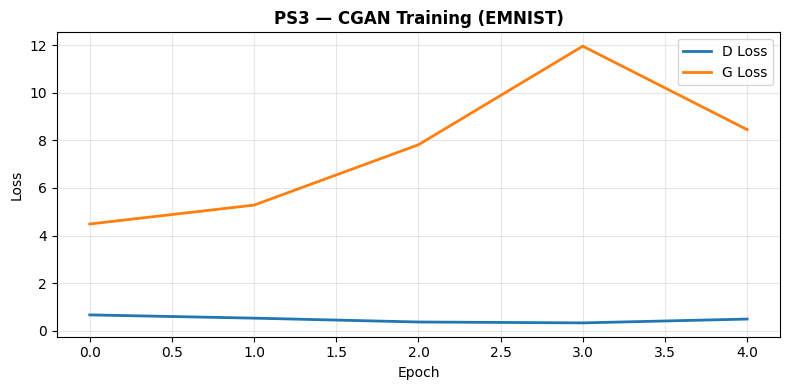

  Saved → lab6_outputs/PS3_cgan_emnist_loss.png


In [22]:
# Train on EMNIST
CG_em = CGenerator(num_classes=EM_CLASSES).to(device)
CD_em = CDiscriminator(num_classes=EM_CLASSES).to(device)

hist_cgan_em = train_cgan(CG_em, CD_em, loader_em11_tr, EM_CLASSES,
                           'EMNIST', fname_prefix=f'{OUT_DIR}/PS3_cgan_emnist')
plot_losses({'D Loss': hist_cgan_em['D_loss'], 'G Loss': hist_cgan_em['G_loss']},
            'PS3 — CGAN Training (EMNIST)', 'PS3_cgan_emnist_loss.png')

### PS3 — Task 11: Class-Conditioned Generation Grid

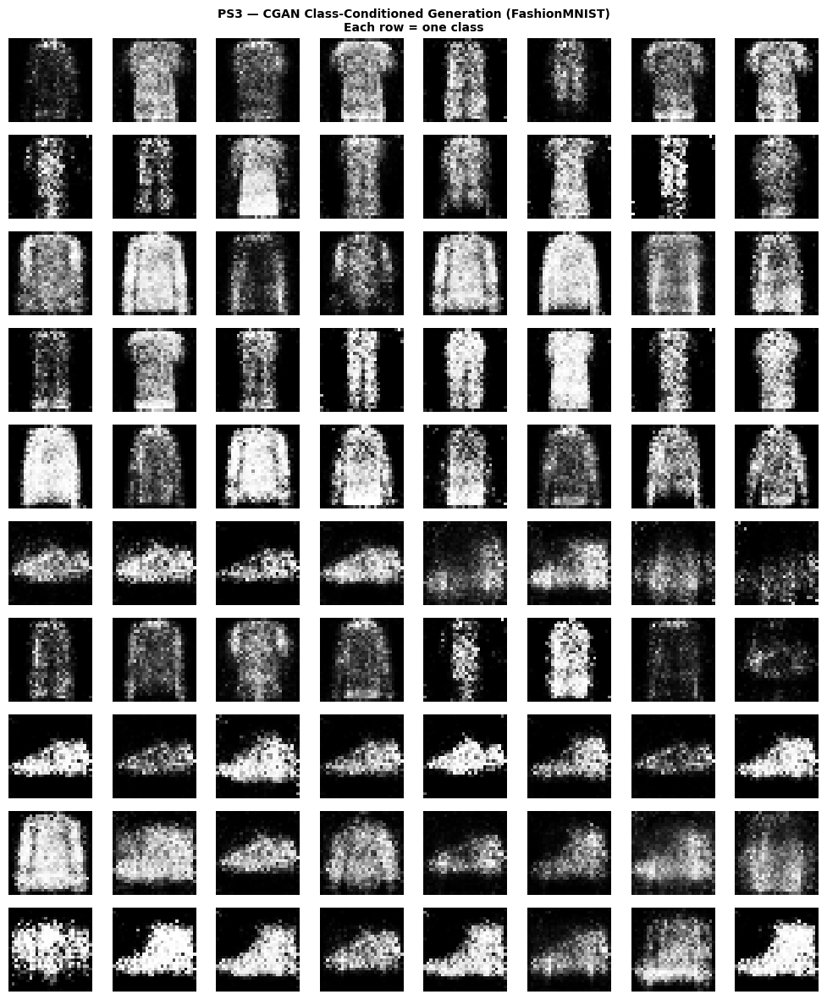

  Saved → lab6_outputs/PS3_cgan_class_grid.png


In [23]:
# Task 11: Class-Specific Generation (one row per class)
CG_fm.eval()
fig, axes = plt.subplots(FM_CLASSES, 8, figsize=(10, FM_CLASSES * 1.2))
for cls in range(FM_CLASSES):
    y_cls = torch.full((8,), cls, dtype=torch.long, device=device)
    z     = torch.randn(8, Z_DIM_GAN, device=device)
    with torch.no_grad():
        imgs = CG_fm(z, y_cls).cpu().squeeze()
    for j, ax in enumerate(axes[cls]):
        ax.imshow((imgs[j].numpy()*0.5+0.5).clip(0,1), cmap='gray'); ax.axis('off')
    axes[cls, 0].set_ylabel(FM_LABELS[cls], fontsize=7, rotation=0, labelpad=55, va='center')

fig.suptitle('PS3 — CGAN Class-Conditioned Generation (FashionMNIST)\nEach row = one class',
             fontweight='bold', fontsize=10)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS3_cgan_class_grid.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

### PS3 — Task 12: Label Interpolation

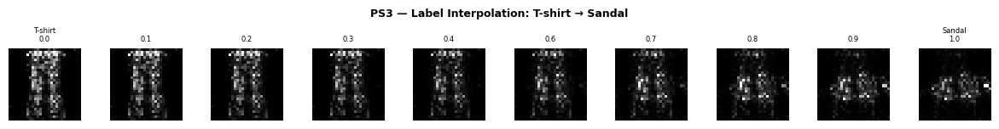

  Saved → lab6_outputs/PS3_cgan_label_interp.png


In [24]:
# Task 12: Label Interpolation — blend one-hot vectors between two classes
CG_fm.eval()
cls_a, cls_b = 0, 5   # T-shirt → Sandal
n_steps = 10
z_fixed = torch.randn(1, Z_DIM_GAN, device=device)

interp_imgs = []
for alpha in np.linspace(0, 1, n_steps):
    oh_a     = F.one_hot(torch.tensor([cls_a]), FM_CLASSES).float().to(device)
    oh_b     = F.one_hot(torch.tensor([cls_b]), FM_CLASSES).float().to(device)
    oh_blend = (1 - alpha) * oh_a + alpha * oh_b
    inp      = torch.cat([z_fixed, oh_blend], dim=1)
    with torch.no_grad():
        img = CG_fm.net(inp).view(1, 1, 28, 28).cpu()
    interp_imgs.append(img.squeeze())

fig, axes = plt.subplots(1, n_steps, figsize=(12, 1.5))
for i, ax in enumerate(axes):
    ax.imshow((interp_imgs[i].numpy()*0.5+0.5).clip(0,1), cmap='gray'); ax.axis('off')
    ax.set_title(f'{i/(n_steps-1):.1f}', fontsize=6)
axes[0].set_title(f'{FM_LABELS[cls_a]}\n0.0', fontsize=6)
axes[-1].set_title(f'{FM_LABELS[cls_b]}\n1.0', fontsize=6)
fig.suptitle(f'PS3 — Label Interpolation: {FM_LABELS[cls_a]} → {FM_LABELS[cls_b]}',
             fontweight='bold', fontsize=9)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS3_cgan_label_interp.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

### PS3 — Task 13: Mismatched Label Attack

python(43886) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43887) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.



--- Task 13: Mismatched Label Attack ---
D accuracy (correct labels) : 75.8%
D accuracy (wrong labels)   : 46.9%
Label sensitivity gap       : 28.9%
Conclusion: D is label-sensitive (CGAN working)


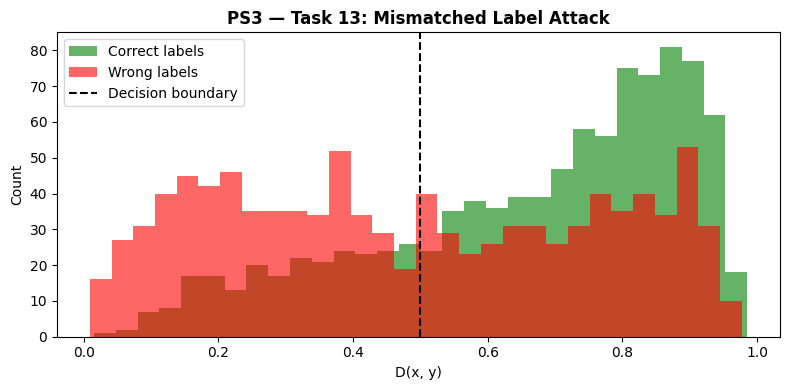

  Saved → lab6_outputs/PS3_cgan_label_attack.png


In [25]:
# Task 13: Mismatched Label Attack
# Test D's accuracy when given correct vs wrong labels
CG_fm.eval(); CD_fm.eval()

correct_scores, wrong_scores = [], []
test_loader_11 = make_loader(fmnist_test_11, shuffle=False)

with torch.no_grad():
    for real, labels in test_loader_11:
        real   = real.to(device)
        labels = labels.to(device)
        bs     = real.size(0)

        # Correct labels
        out_correct = CD_fm(real, labels).squeeze()
        correct_scores.extend(out_correct.cpu().numpy())

        # Wrong labels (shift by 1 mod num_classes)
        wrong_labels = (labels + 1) % FM_CLASSES
        out_wrong = CD_fm(real, wrong_labels).squeeze()
        wrong_scores.extend(out_wrong.cpu().numpy())

        if len(correct_scores) >= 1000: break

correct_scores = np.array(correct_scores[:1000])
wrong_scores   = np.array(wrong_scores[:1000])
acc_correct = float((correct_scores > 0.5).mean())
acc_wrong   = float((wrong_scores   > 0.5).mean())

print("\n--- Task 13: Mismatched Label Attack ---")
print(f"D accuracy (correct labels) : {acc_correct*100:.1f}%")
print(f"D accuracy (wrong labels)   : {acc_wrong*100:.1f}%")
print(f"Label sensitivity gap       : {(acc_correct - acc_wrong)*100:.1f}%")
print("Conclusion: " + ("D is label-sensitive (CGAN working)" if acc_correct > acc_wrong + 0.05
                         else "D is label-insensitive — may need more training"))

# Plot score distributions
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(correct_scores, bins=30, alpha=0.6, label='Correct labels', color='green')
ax.hist(wrong_scores,   bins=30, alpha=0.6, label='Wrong labels',   color='red')
ax.axvline(0.5, color='black', linestyle='--', label='Decision boundary')
ax.set_xlabel('D(x, y)'); ax.set_ylabel('Count')
ax.set_title('PS3 — Task 13: Mismatched Label Attack', fontweight='bold')
ax.legend()
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS3_cgan_label_attack.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

### PS3 — Task 15: Intra-Class Diversity

In [26]:
# Task 15: Intra-Class Diversity — pixel variance per class
CG_fm.eval()
print("\n--- Task 15: Intra-Class Diversity (pixel variance) ---")
print(f"{'Class':<12} {'Pixel Variance':>15}")
print("-" * 30)

intra_vars = {}
for cls in range(FM_CLASSES):
    y_cls = torch.full((100,), cls, dtype=torch.long, device=device)
    z     = torch.randn(100, Z_DIM_GAN, device=device)
    with torch.no_grad():
        imgs = CG_fm(z, y_cls).cpu().numpy()
    imgs = (imgs * 0.5 + 0.5).clip(0, 1)
    pv   = float(np.var(imgs, axis=0).mean())
    intra_vars[cls] = pv
    print(f"{FM_LABELS[cls]:<12} {pv:>15.6f}")

most_diverse = max(intra_vars, key=intra_vars.get)
least_diverse= min(intra_vars, key=intra_vars.get)
print(f"\nMost diverse class : {FM_LABELS[most_diverse]} (var={intra_vars[most_diverse]:.6f})")
print(f"Least diverse class: {FM_LABELS[least_diverse]} (var={intra_vars[least_diverse]:.6f})")


--- Task 15: Intra-Class Diversity (pixel variance) ---
Class         Pixel Variance
------------------------------
T-shirt             0.042557
Trouser             0.036664
Pullover            0.052899
Dress               0.036107
Coat                0.047262
Sandal              0.031644
Shirt               0.049085
Sneaker             0.028576
Bag                 0.052901
Ankle boot          0.037992

Most diverse class : Bag (var=0.052901)
Least diverse class: Sneaker (var=0.028576)


---
# 🔴 Problem Statement 4: Deep Convolutional GAN (DCGAN)

**Objective:** Leverage convolutional architecture (Radford et al., 2015) for higher-quality image generation.

### DCGAN Design Rules
1. Replace pooling with **strided convolutions** (D) / **fractional-strided ConvTranspose** (G)
2. **BatchNorm** in both G and D (except G output layer and D input layer)
3. Remove all FC hidden layers
4. **ReLU** in G (except output → Tanh)
5. **LeakyReLU** in D throughout

### Tasks
16. Baseline DCGAN on both datasets
17. BatchNorm Ablation Study
18. Spectral Normalisation
19. Progressive Growing
20. Latent Space Arithmetic

### PS4 — DCGAN Architecture

In [27]:
class DCGenerator(nn.Module):
    """DCGAN Generator following Radford et al. (2015)."""
    def __init__(self, z_dim=Z_DIM_GAN, ngf=64):
        super().__init__()
        self.ngf = ngf
        self.project = nn.Sequential(
            nn.Linear(z_dim, ngf * 4 * 7 * 7, bias=False),
            nn.BatchNorm1d(ngf * 4 * 7 * 7),
            nn.ReLU(inplace=True),
        )
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf*2), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(ngf*2, ngf,   4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf),   nn.ReLU(inplace=True),
            nn.ConvTranspose2d(ngf,   1,     3, stride=1, padding=1, bias=False),
            nn.Tanh(),
        )

    def forward(self, z):
        h = self.project(z).view(-1, self.ngf * 4, 7, 7)
        return self.deconv(h)


class DCDiscriminator(nn.Module):
    """DCGAN Discriminator — strided convolutions, no pooling."""
    def __init__(self, ndf=64):
        super().__init__()
        self.net = nn.Sequential(
            # No BN on first layer
            nn.Conv2d(1, ndf,    4, stride=2, padding=1, bias=False), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf*2,4, stride=2, padding=1, bias=False), nn.BatchNorm2d(ndf*2), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*2, ndf*4, 3, stride=1, padding=1, bias=False), nn.BatchNorm2d(ndf*4), nn.LeakyReLU(0.2, inplace=True),
            nn.Flatten(),
            nn.Linear(ndf * 4 * 7 * 7, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.net(x)


def weights_init(m):
    classname = m.__class__.__name__
    if 'Conv' in classname or 'Linear' in classname:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif 'BatchNorm' in classname:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


_dcG = DCGenerator(); _dcD = DCDiscriminator()
_dcG.apply(weights_init); _dcD.apply(weights_init)
_z = torch.randn(4, Z_DIM_GAN)
_f = _dcG(_z)
print(f"DCG output : {list(_f.shape)}")
print(f"DCD output : {list(_dcD(_f).shape)}")
del _dcG, _dcD, _z, _f
print("DCGAN architectures ready ✓")

DCG output : [4, 1, 28, 28]
DCD output : [4, 1]
DCGAN architectures ready ✓


### PS4 — DCGAN Training Loop


Training DCGAN on FashionMNIST for 5 epochs...


python(43888) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43889) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/5 | D=0.6757  G=2.9257


python(43927) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(43928) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/5 | D=0.8427  G=2.2705


python(44056) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(44057) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/5 | D=0.8964  G=1.8495


python(44099) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(44100) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   4/5 | D=0.8991  G=1.8548


python(44161) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(44162) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   5/5 | D=0.9228  G=1.7706


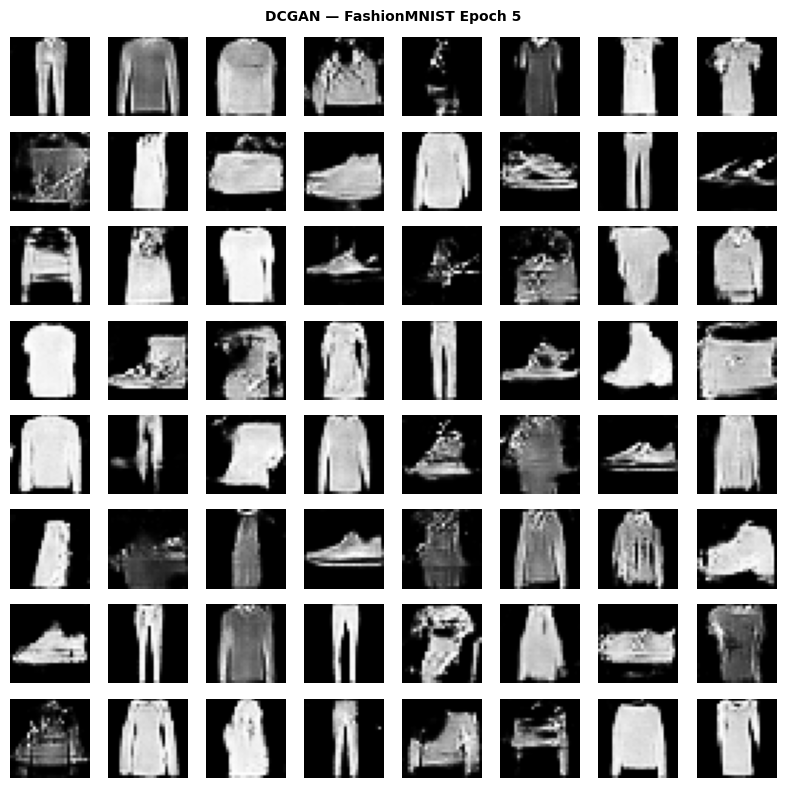

  Saved → lab6_outputs/PS4_dcgan_fmnist_epoch005.png


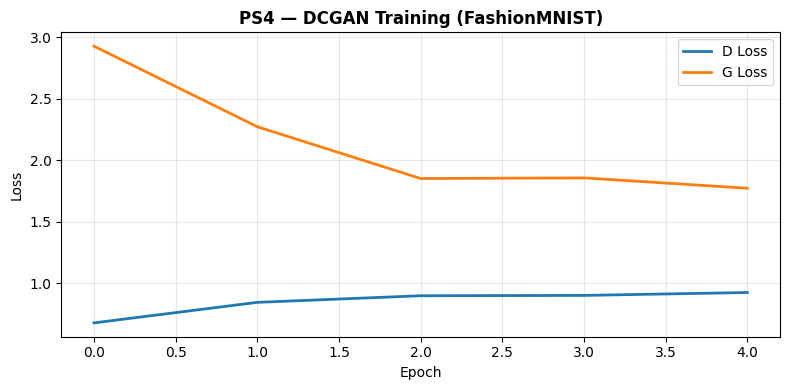

  Saved → lab6_outputs/PS4_dcgan_fmnist_loss.png


In [28]:
def train_dcgan(DG, DD, train_loader, dataset_name='Dataset',
                epochs=EPOCHS, lr=LR_GAN, z_dim=Z_DIM_GAN,
                save_every=5, fname_prefix='PS4_dcgan'):
    criterion = nn.BCELoss()
    opt_D = optim.Adam(DD.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_G = optim.Adam(DG.parameters(), lr=lr, betas=(0.5, 0.999))
    hist  = {'D_loss':[], 'G_loss':[]}
    fixed_z = torch.randn(64, z_dim, device=device)

    print(f"\nTraining DCGAN on {dataset_name} for {epochs} epochs...")
    for epoch in range(1, epochs + 1):
        DG.train(); DD.train()
        d_ep = g_ep = 0.0
        for real, _ in train_loader:
            real = real.to(device)
            bs   = real.size(0)
            real_lbl = torch.full((bs, 1), 0.9, device=device)
            fake_lbl = torch.zeros(bs, 1, device=device)

            z    = torch.randn(bs, z_dim, device=device)
            fake = DG(z).detach()
            opt_D.zero_grad()
            loss_D = criterion(DD(real), real_lbl) + criterion(DD(fake), fake_lbl)
            loss_D.backward(); opt_D.step()
            d_ep += loss_D.item()

            z    = torch.randn(bs, z_dim, device=device)
            fake = DG(z)
            opt_G.zero_grad()
            loss_G = criterion(DD(fake), torch.ones(bs, 1, device=device))
            loss_G.backward(); opt_G.step()
            g_ep += loss_G.item()

        hist['D_loss'].append(d_ep / len(train_loader))
        hist['G_loss'].append(g_ep / len(train_loader))
        print(f"  Epoch {epoch:>3}/{epochs} | D={hist['D_loss'][-1]:.4f}  G={hist['G_loss'][-1]:.4f}")

        if epoch % save_every == 0 or epoch == epochs:
            DG.eval()
            with torch.no_grad():
                prog = DG(fixed_z)
            save_image_grid(prog, f'DCGAN — {dataset_name} Epoch {epoch}',
                            f'{fname_prefix}_epoch{epoch:03d}.png', denorm=True)
            DG.train()
    return hist


DCG_fm = DCGenerator().to(device); DCG_fm.apply(weights_init)
DCD_fm = DCDiscriminator().to(device); DCD_fm.apply(weights_init)

hist_dcgan_fm = train_dcgan(DCG_fm, DCD_fm, loader_fm11_tr, 'FashionMNIST',
                             fname_prefix=f'{OUT_DIR}/PS4_dcgan_fmnist')
plot_losses({'D Loss': hist_dcgan_fm['D_loss'], 'G Loss': hist_dcgan_fm['G_loss']},
            'PS4 — DCGAN Training (FashionMNIST)', 'PS4_dcgan_fmnist_loss.png')


Training DCGAN on EMNIST for 5 epochs...


python(44293) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(44294) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/5 | D=0.7841  G=2.4665


python(46635) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(46636) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/5 | D=0.8146  G=2.1573


python(55990) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(55991) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/5 | D=0.8176  G=2.1332


python(61988) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(61989) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   4/5 | D=0.8055  G=2.1299


python(62088) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62089) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   5/5 | D=0.7836  G=2.1994


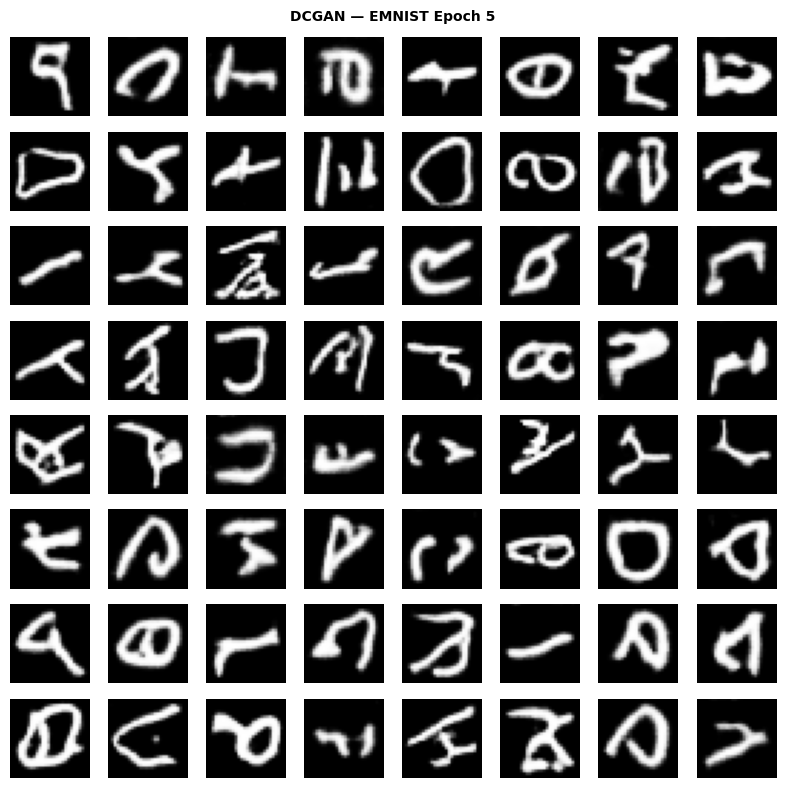

  Saved → lab6_outputs/PS4_dcgan_emnist_epoch005.png


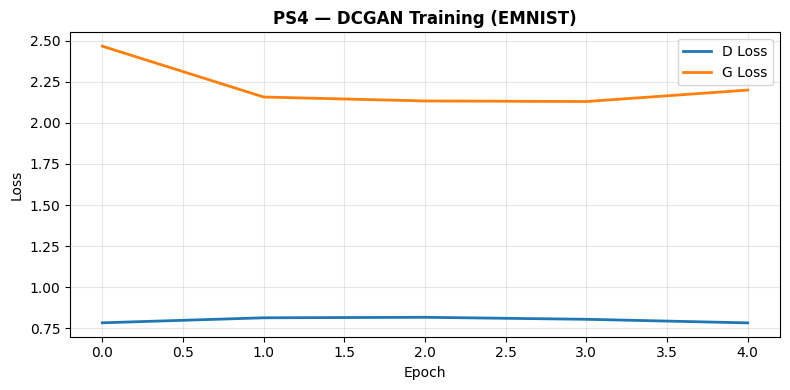

  Saved → lab6_outputs/PS4_dcgan_emnist_loss.png


In [29]:
DCG_em = DCGenerator().to(device); DCG_em.apply(weights_init)
DCD_em = DCDiscriminator().to(device); DCD_em.apply(weights_init)

hist_dcgan_em = train_dcgan(DCG_em, DCD_em, loader_em11_tr, 'EMNIST',
                             fname_prefix=f'{OUT_DIR}/PS4_dcgan_emnist')
plot_losses({'D Loss': hist_dcgan_em['D_loss'], 'G Loss': hist_dcgan_em['G_loss']},
            'PS4 — DCGAN Training (EMNIST)', 'PS4_dcgan_emnist_loss.png')

### PS4 — Task 17: BatchNorm Ablation Study


=== BatchNorm Ablation: G+D (standard) ===

Training DCGAN on G+D (standard) for 3 epochs...


python(62112) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62113) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/3 | D=0.6826  G=2.9288


python(62152) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62153) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/3 | D=0.7873  G=2.3961


python(62179) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62180) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/3 | D=0.8644  G=1.9618


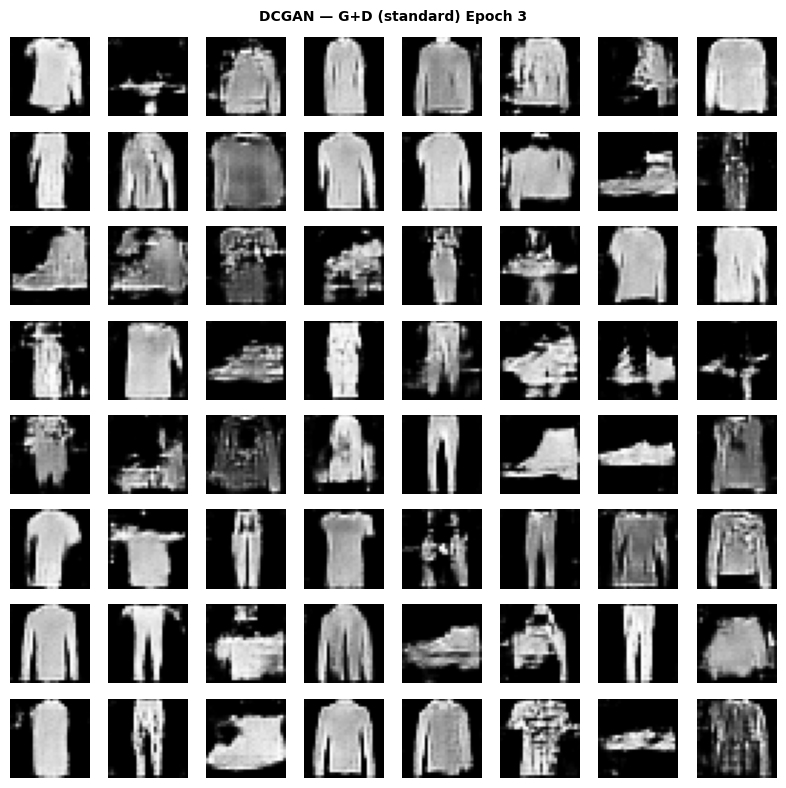

  Saved → lab6_outputs/PS4_bn_abl_G+D_(standard)_epoch003.png

=== BatchNorm Ablation: No BN in G ===

Training DCGAN on No BN in G for 3 epochs...


python(62201) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62202) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/3 | D=0.4990  G=4.1384


python(62220) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62221) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/3 | D=0.5356  G=3.8044


python(62230) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62231) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/3 | D=0.6335  G=3.0696


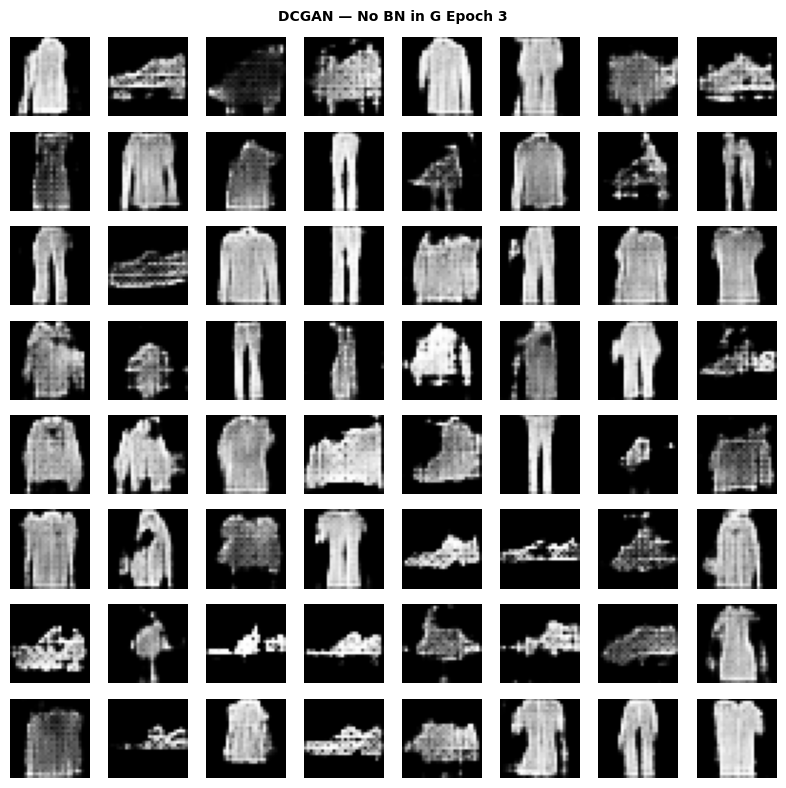

  Saved → lab6_outputs/PS4_bn_abl_No_BN_in_G_epoch003.png

=== BatchNorm Ablation: No BN in D ===

Training DCGAN on No BN in D for 3 epochs...


python(62257) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62258) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/3 | D=1.3216  G=0.7807


python(62273) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62274) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/3 | D=1.2712  G=0.9707


python(62312) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62313) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/3 | D=1.2886  G=0.9572


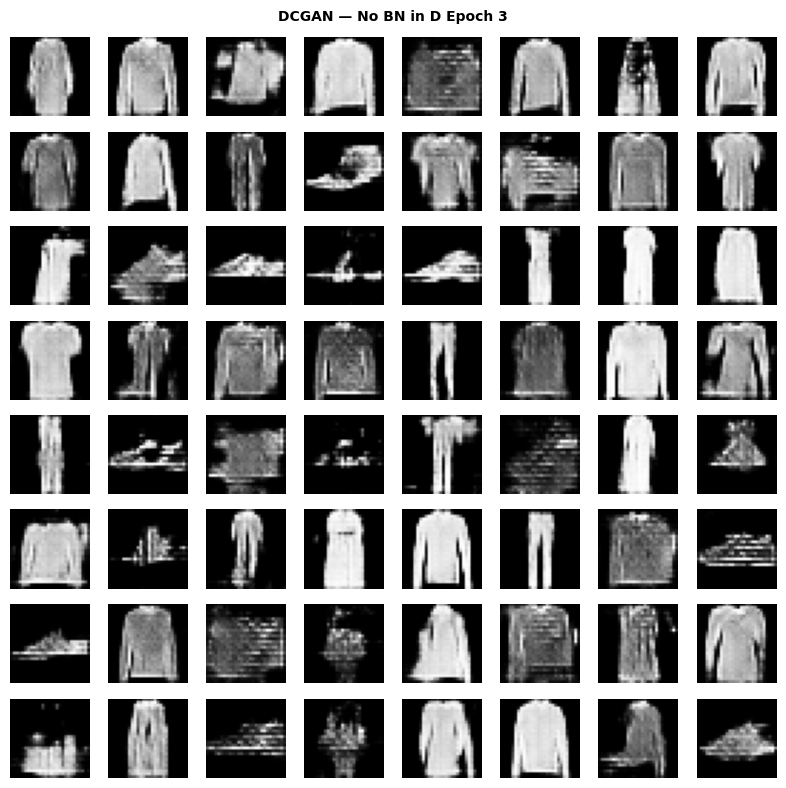

  Saved → lab6_outputs/PS4_bn_abl_No_BN_in_D_epoch003.png

=== BatchNorm Ablation: No BN at all ===

Training DCGAN on No BN at all for 3 epochs...


python(62322) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62323) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/3 | D=1.2130  G=0.7759


python(62343) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62344) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/3 | D=1.1188  G=0.7516


python(62348) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62349) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/3 | D=1.1691  G=0.7909


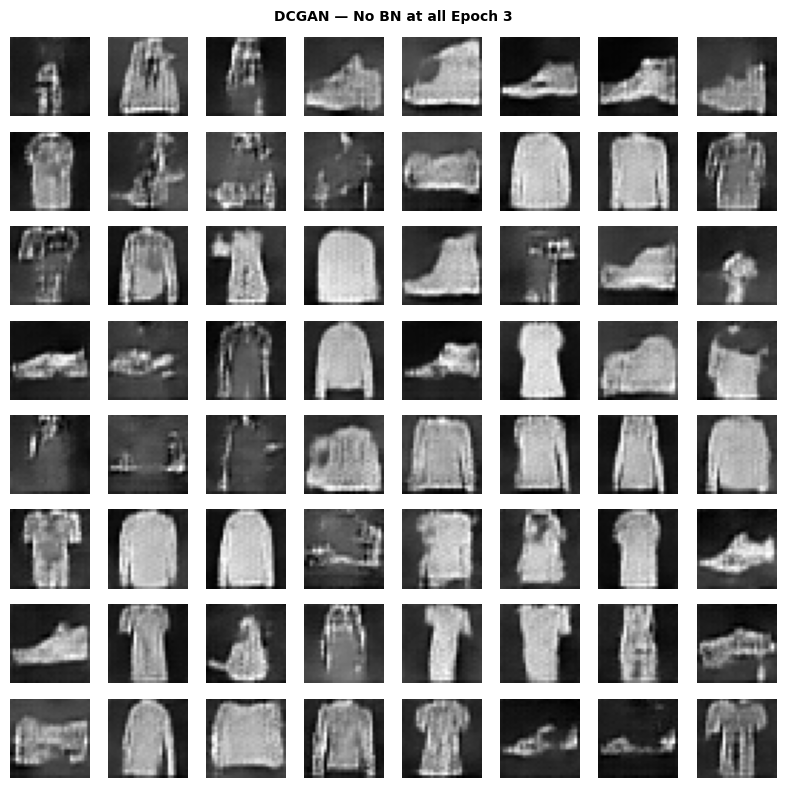

  Saved → lab6_outputs/PS4_bn_abl_No_BN_at_all_epoch003.png


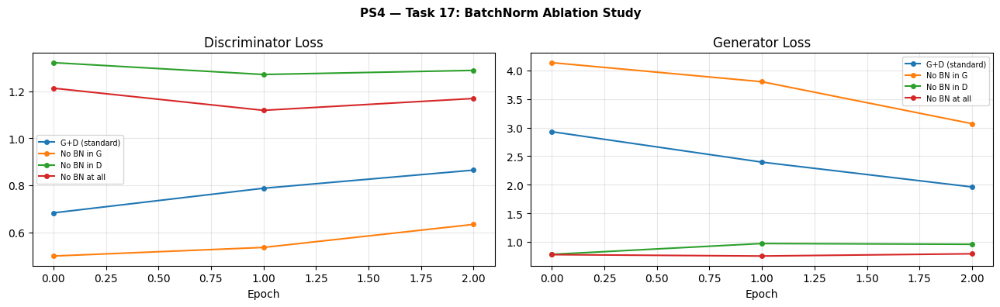

  Saved → lab6_outputs/PS4_batchnorm_ablation.png


In [30]:
# Task 17: Remove BN from G, from D, from both — compare stability
def make_dcg_no_bn(z_dim=Z_DIM_GAN, ngf=64):
    """DCGenerator WITHOUT BatchNorm."""
    class DCG_NoBN(nn.Module):
        def __init__(self):
            super().__init__()
            self.ngf = ngf
            self.project = nn.Sequential(
                nn.Linear(z_dim, ngf*4*7*7, bias=False), nn.ReLU(inplace=True))
            self.deconv = nn.Sequential(
                nn.ConvTranspose2d(ngf*4, ngf*2, 4, stride=2, padding=1, bias=False), nn.ReLU(inplace=True),
                nn.ConvTranspose2d(ngf*2, ngf,   4, stride=2, padding=1, bias=False), nn.ReLU(inplace=True),
                nn.ConvTranspose2d(ngf,     1,   3, stride=1, padding=1, bias=False), nn.Tanh())
        def forward(self, z):
            return self.deconv(self.project(z).view(-1, ngf*4, 7, 7))
    return DCG_NoBN()

def make_dcd_no_bn(ndf=64):
    """DCDiscriminator WITHOUT BatchNorm."""
    class DCD_NoBN(nn.Module):
        def __init__(self):
            super().__init__()
            self.net = nn.Sequential(
                nn.Conv2d(1, ndf,    4, stride=2, padding=1, bias=False), nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(ndf, ndf*2,4, stride=2, padding=1, bias=False), nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(ndf*2,ndf*4,3, stride=1, padding=1,bias=False), nn.LeakyReLU(0.2, inplace=True),
                nn.Flatten(), nn.Linear(ndf*4*7*7, 1), nn.Sigmoid())
        def forward(self, x): return self.net(x)
    return DCD_NoBN()

bn_configs = {
    'G+D (standard)': (DCGenerator(),  DCDiscriminator()),
    'No BN in G':     (make_dcg_no_bn(), DCDiscriminator()),
    'No BN in D':     (DCGenerator(),  make_dcd_no_bn()),
    'No BN at all':   (make_dcg_no_bn(), make_dcd_no_bn()),
}

bn_histories = {}
for config_name, (G_abl, D_abl) in bn_configs.items():
    print(f"\n=== BatchNorm Ablation: {config_name} ===")
    G_abl = G_abl.to(device); D_abl = D_abl.to(device)
    G_abl.apply(weights_init); D_abl.apply(weights_init)
    hist_abl = train_dcgan(G_abl, D_abl, loader_fm11_tr, config_name, epochs=min(EPOCHS, 3),
                            fname_prefix=f'{OUT_DIR}/PS4_bn_abl_{config_name.replace(" ","_")}')
    bn_histories[config_name] = hist_abl
    del G_abl, D_abl

# Plot all configs on same axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 4))
for cfg, h in bn_histories.items():
    ax1.plot(h['D_loss'], label=cfg, marker='o', markersize=4)
    ax2.plot(h['G_loss'], label=cfg, marker='o', markersize=4)
ax1.set_title('Discriminator Loss'); ax2.set_title('Generator Loss')
for ax in (ax1, ax2): ax.legend(fontsize=7); ax.grid(True, alpha=0.3); ax.set_xlabel('Epoch')
fig.suptitle('PS4 — Task 17: BatchNorm Ablation Study', fontweight='bold', fontsize=11)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS4_batchnorm_ablation.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

### PS4 — Task 18: Spectral Normalisation

Training DCGAN with Spectral Normalization on D...

Training DCGAN on FashionMNIST (SN) for 5 epochs...


python(62534) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62535) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/5 | D=1.2113  G=0.9015


python(62640) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62641) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/5 | D=1.1686  G=0.9781


python(62677) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62678) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/5 | D=1.2552  G=0.9481


python(62775) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62776) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   4/5 | D=1.2853  G=0.9146


python(62848) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62849) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   5/5 | D=1.3031  G=0.8949


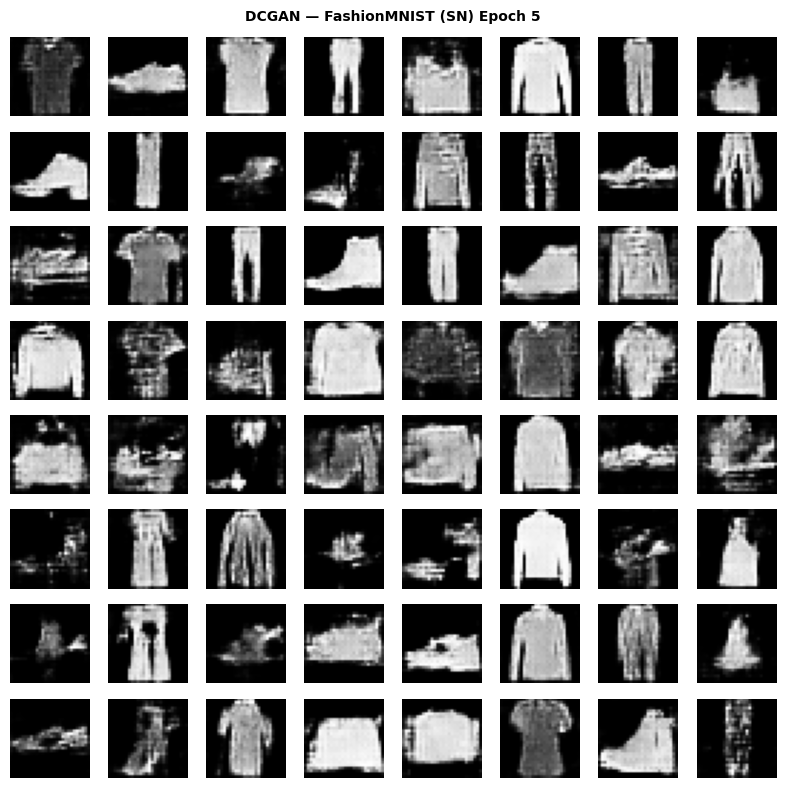

  Saved → lab6_outputs/PS4_dcgan_sn_epoch005.png


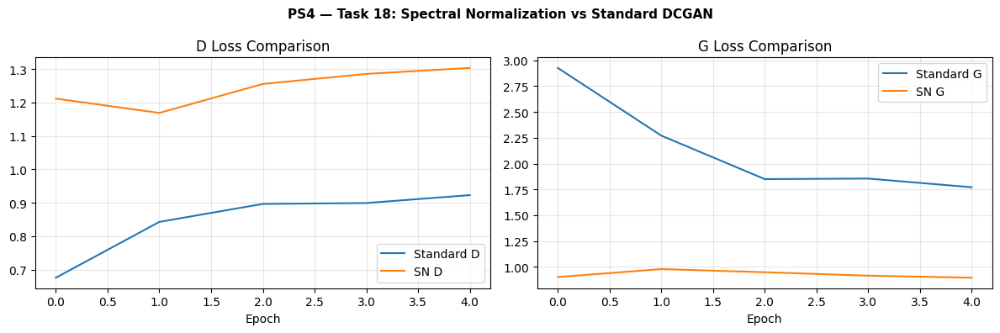

  Saved → lab6_outputs/PS4_spectral_norm_comparison.png


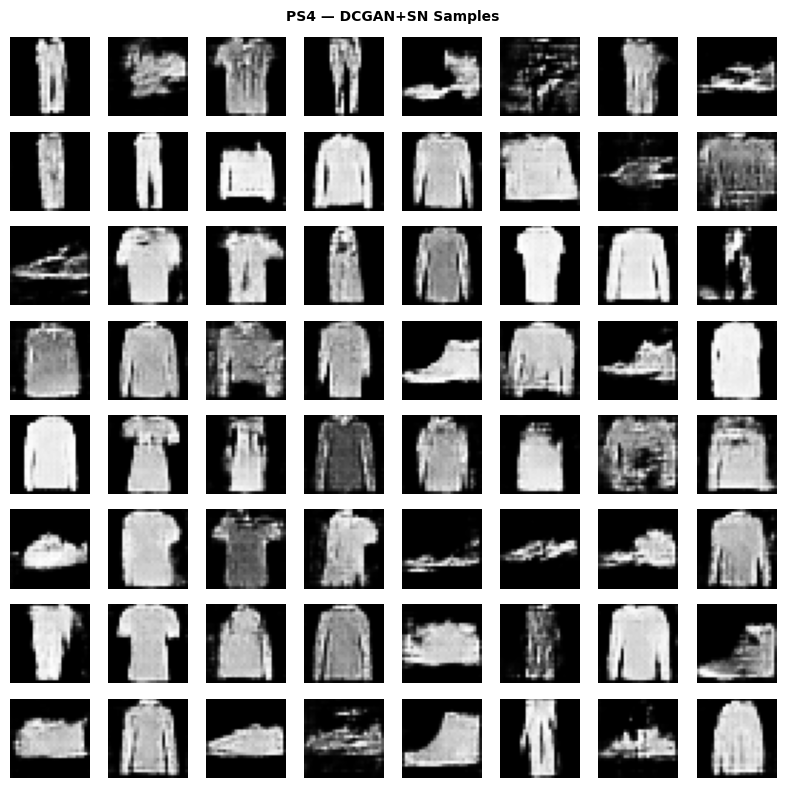

  Saved → lab6_outputs/PS4_dcgan_sn_samples.png


In [31]:
# Task 18: Spectral Normalisation on D — enforces Lipschitz constraint
from torch.nn.utils import spectral_norm

class DCDiscriminator_SN(nn.Module):
    """DCGAN Discriminator with Spectral Normalisation on all layers."""
    def __init__(self, ndf=64):
        super().__init__()
        self.net = nn.Sequential(
            spectral_norm(nn.Conv2d(1, ndf, 4, stride=2, padding=1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            spectral_norm(nn.Conv2d(ndf, ndf*2, 4, stride=2, padding=1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            spectral_norm(nn.Conv2d(ndf*2, ndf*4, 3, stride=1, padding=1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Flatten(),
            spectral_norm(nn.Linear(ndf*4*7*7, 1)),
            nn.Sigmoid(),
        )

    def forward(self, x): return self.net(x)


print("Training DCGAN with Spectral Normalization on D...")
DCG_sn = DCGenerator().to(device); DCG_sn.apply(weights_init)
DCD_sn = DCDiscriminator_SN().to(device)

hist_sn = train_dcgan(DCG_sn, DCD_sn, loader_fm11_tr, 'FashionMNIST (SN)',
                       fname_prefix=f'{OUT_DIR}/PS4_dcgan_sn')

# Compare standard DCGAN vs SN-DCGAN
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(hist_dcgan_fm['D_loss'], label='Standard D'); ax1.plot(hist_sn['D_loss'], label='SN D')
ax2.plot(hist_dcgan_fm['G_loss'], label='Standard G'); ax2.plot(hist_sn['G_loss'], label='SN G')
ax1.set_title('D Loss Comparison'); ax2.set_title('G Loss Comparison')
for ax in (ax1, ax2): ax.legend(); ax.grid(True, alpha=0.3); ax.set_xlabel('Epoch')
fig.suptitle('PS4 — Task 18: Spectral Normalization vs Standard DCGAN', fontweight='bold', fontsize=11)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS4_spectral_norm_comparison.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

DCG_sn.eval()
with torch.no_grad():
    sn_samples = DCG_sn(torch.randn(64, Z_DIM_GAN, device=device))
save_image_grid(sn_samples, 'PS4 — DCGAN+SN Samples', 'PS4_dcgan_sn_samples.png', denorm=True)
del DCG_sn, DCD_sn

### PS4 — Task 19: Progressive Growing (7→14→28)


  Progressive stage: 7×7 (1 epochs)


python(62880) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62881) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


    Epoch 1/1 | D=0.4544  G=4.6454


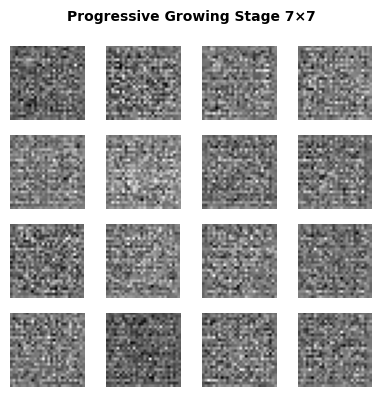

  Saved → lab6_outputs/PS4_prog_grow_stage7.png

  Progressive stage: 14×14 (1 epochs)


python(62891) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62892) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


    Epoch 1/1 | D=0.5866  G=3.4665


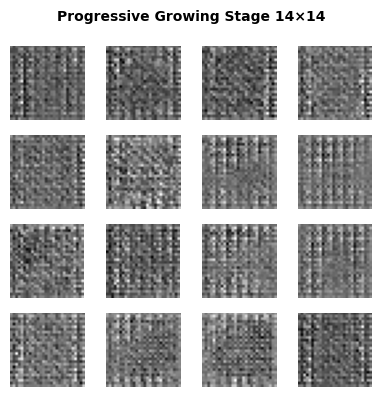

  Saved → lab6_outputs/PS4_prog_grow_stage14.png

  Progressive stage: 28×28 (1 epochs)


python(62914) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62915) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


    Epoch 1/1 | D=0.6065  G=3.3391


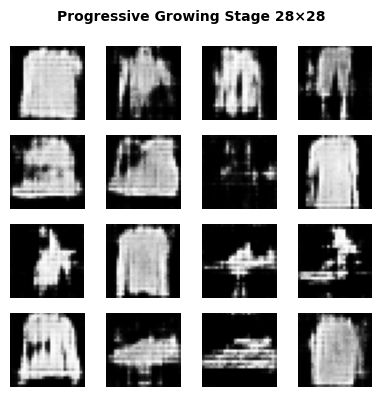

  Saved → lab6_outputs/PS4_prog_grow_stage28.png

Progressive Growing complete ✓


In [32]:
# Task 19: Progressive Growing — train at 7×7, 14×14, then 28×28
class ProgGenerator(nn.Module):
    """Generator that can output at different resolutions for progressive growing."""
    def __init__(self, z_dim=Z_DIM_GAN, ngf=64):
        super().__init__()
        self.ngf = ngf
        self.project = nn.Sequential(
            nn.Linear(z_dim, ngf*4*7*7, bias=False),
            nn.BatchNorm1d(ngf*4*7*7), nn.ReLU(inplace=True))
        self.block1 = nn.Sequential(
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf*2), nn.ReLU(inplace=True))   # → 14×14
        self.block2 = nn.Sequential(
            nn.ConvTranspose2d(ngf*2, ngf, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(ngf),   nn.ReLU(inplace=True))   # → 28×28
        self.to_img_7  = nn.Sequential(nn.ConvTranspose2d(ngf*4, 1, 1), nn.Tanh())
        self.to_img_14 = nn.Sequential(nn.ConvTranspose2d(ngf*2, 1, 1), nn.Tanh())
        self.to_img_28 = nn.Sequential(nn.Conv2d(ngf, 1, 3, padding=1), nn.Tanh())

    def forward(self, z, resolution=28):
        h = self.project(z).view(-1, self.ngf*4, 7, 7)
        if resolution == 7:
            return self.to_img_7(h)
        h = self.block1(h)
        if resolution == 14:
            return self.to_img_14(h)
        h = self.block2(h)
        return self.to_img_28(h)


def progressive_grow_train(loader_fn, epochs_per_stage=max(1, EPOCHS//3)):
    prog_G = ProgGenerator().to(device); prog_G.apply(weights_init)
    prog_D = DCDiscriminator().to(device); prog_D.apply(weights_init)
    criterion = nn.BCELoss()
    opt_D = optim.Adam(prog_D.parameters(), lr=LR_GAN, betas=(0.5, 0.999))
    opt_G = optim.Adam(prog_G.parameters(), lr=LR_GAN, betas=(0.5, 0.999))

    resolutions = [7, 14, 28]
    stage_losses = {}

    for res in resolutions:
        print(f"\n  Progressive stage: {res}×{res} ({epochs_per_stage} epochs)")
        # Loader with images downsampled to current resolution
        tfm_res = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize(res),
            transforms.Normalize([0.5],[0.5])
        ])
        ds_res  = datasets.FashionMNIST('./data', train=True, download=False, transform=tfm_res)
        ldr_res = DataLoader(ds_res, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

        fixed_z = torch.randn(16, Z_DIM_GAN, device=device)
        stage_losses[res] = {'D':[], 'G':[]}

        for epoch in range(1, epochs_per_stage + 1):
            prog_G.train(); prog_D.train()
            d_ep = g_ep = 0.0
            for real, _ in ldr_res:
                real = real.to(device)
                bs   = real.size(0)
                # Resize real to current res for D
                real_res = F.interpolate(real, size=res) if res < 28 else real
                # Resize to 28 for D input (D expects 28×28)
                real_28  = F.interpolate(real_res, size=28)

                z    = torch.randn(bs, Z_DIM_GAN, device=device)
                fake_res = prog_G(z, resolution=res)
                fake_28  = F.interpolate(fake_res, size=28) if res < 28 else fake_res

                opt_D.zero_grad()
                rl = torch.full((bs,1), 0.9, device=device)
                fl = torch.zeros(bs,1, device=device)
                loss_D = criterion(prog_D(real_28), rl) + criterion(prog_D(fake_28.detach()), fl)
                loss_D.backward(); opt_D.step(); d_ep += loss_D.item()

                z    = torch.randn(bs, Z_DIM_GAN, device=device)
                fake_res = prog_G(z, resolution=res)
                fake_28  = F.interpolate(fake_res, size=28) if res < 28 else fake_res
                opt_G.zero_grad()
                loss_G = criterion(prog_D(fake_28), torch.ones(bs,1,device=device))
                loss_G.backward(); opt_G.step(); g_ep += loss_G.item()

            stage_losses[res]['D'].append(d_ep/len(ldr_res))
            stage_losses[res]['G'].append(g_ep/len(ldr_res))
            print(f"    Epoch {epoch}/{epochs_per_stage} | D={stage_losses[res]['D'][-1]:.4f}  G={stage_losses[res]['G'][-1]:.4f}")

        prog_G.eval()
        with torch.no_grad():
            prog_samples = prog_G(fixed_z, resolution=28)
        save_image_grid(prog_samples, f'Progressive Growing Stage {res}×{res}',
                        f'PS4_prog_grow_stage{res}.png', denorm=True, nrow=4)
        prog_G.train()

    print("\nProgressive Growing complete ✓")
    return prog_G, stage_losses

prog_G, prog_losses = progressive_grow_train(loader_fm11_tr)
del prog_G

### PS4 — Task 20: Latent Space Arithmetic & Feature Maps

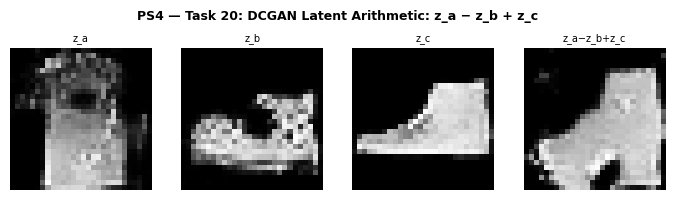

  Saved → lab6_outputs/PS4_dcgan_arithmetic.png


python(62963) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62964) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


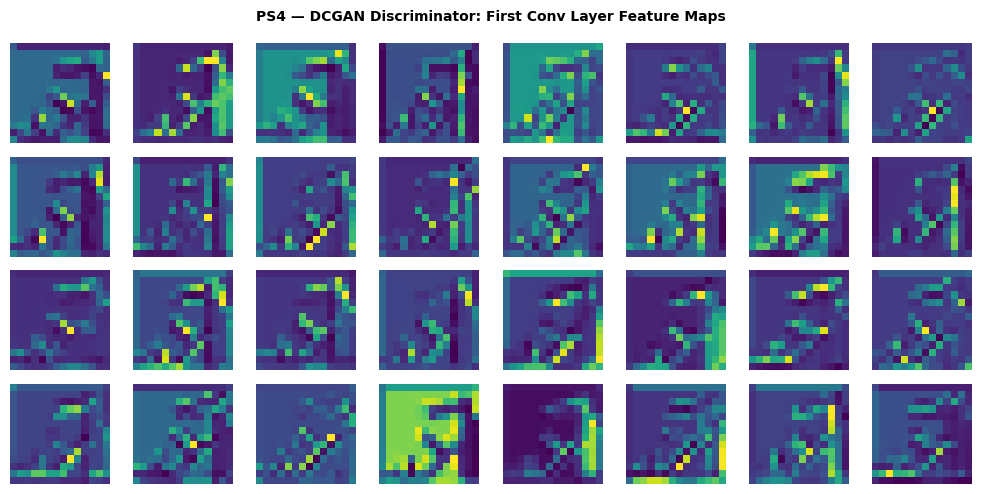

  Saved → lab6_outputs/PS4_dcgan_feature_maps.png


In [33]:
# Task 20: Latent Space Arithmetic
DCG_fm.eval()
set_seed(1)
z_a = torch.randn(1, Z_DIM_GAN, device=device)
z_b = torch.randn(1, Z_DIM_GAN, device=device)
z_c = torch.randn(1, Z_DIM_GAN, device=device)
z_result = z_a - z_b + z_c

samples_arith = []
for name, z in [('z_a', z_a), ('z_b', z_b), ('z_c', z_c), ('z_a−z_b+z_c', z_result)]:
    with torch.no_grad():
        img = DCG_fm(z).cpu()
    samples_arith.append((name, img.squeeze()))

fig, axes = plt.subplots(1, 4, figsize=(7, 2))
for ax, (name, img) in zip(axes, samples_arith):
    ax.imshow((img.numpy()*0.5+0.5).clip(0,1), cmap='gray'); ax.axis('off')
    ax.set_title(name, fontsize=7)
fig.suptitle('PS4 — Task 20: DCGAN Latent Arithmetic: z_a − z_b + z_c',
             fontweight='bold', fontsize=9)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS4_dcgan_arithmetic.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

# Feature Map Visualisation (D's first conv layer)
DCD_fm.eval()
x_sample = next(iter(loader_fm11_tr))[0][:1].to(device)
activation = {}
def hook_fn(m, i, o): activation['first_conv'] = o
hook = list(DCD_fm.net.children())[0].register_forward_hook(hook_fn)
with torch.no_grad():
    DCD_fm(x_sample)
hook.remove()

feat_maps = activation['first_conv'].squeeze().cpu()  # (64, 14, 14)
n_show    = min(32, feat_maps.shape[0])
fig, axes = plt.subplots(4, 8, figsize=(10, 5))
for i, ax in enumerate(axes.flat):
    if i < n_show:
        ax.imshow(feat_maps[i].numpy(), cmap='viridis')
    ax.axis('off')
fig.suptitle('PS4 — DCGAN Discriminator: First Conv Layer Feature Maps',
             fontweight='bold', fontsize=10)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS4_dcgan_feature_maps.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

---
# 📊 Problem Statement 5: Comparative Study — VAE vs GAN vs CGAN vs DCGAN

Systematic comparison across quality, diversity, controllability, and training stability.

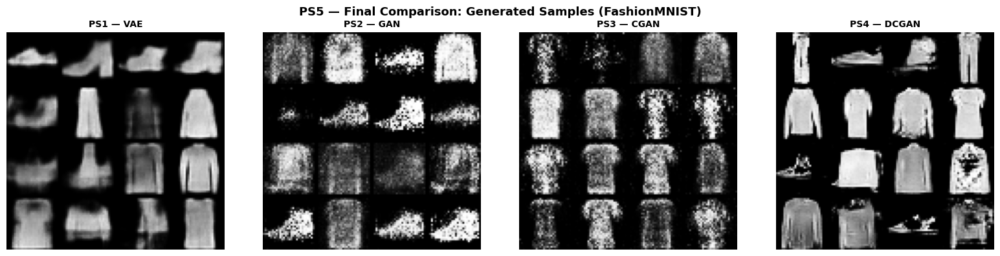

  Saved → lab6_outputs/PS5_comparison_samples.png


In [34]:
# ── Side-by-side: VAE | GAN | CGAN | DCGAN samples ────────────
fig, big_axes = plt.subplots(1, 4, figsize=(16, 4))
titles = ['PS1 — VAE', 'PS2 — GAN', 'PS3 — CGAN', 'PS4 — DCGAN']

vae_fmnist.eval()
with torch.no_grad():
    v_s = vae_fmnist.sample(16, device).cpu()

G_fm.eval()
with torch.no_grad():
    g_s = G_fm(torch.randn(16, Z_DIM_GAN, device=device)).cpu()
g_s = (g_s * 0.5 + 0.5).clamp(0, 1)

CG_fm.eval()
with torch.no_grad():
    cg_s = CG_fm(torch.randn(16, Z_DIM_GAN, device=device),
                 torch.zeros(16, dtype=torch.long, device=device)).cpu()
cg_s = (cg_s * 0.5 + 0.5).clamp(0, 1)

DCG_fm.eval()
with torch.no_grad():
    dc_s = DCG_fm(torch.randn(16, Z_DIM_GAN, device=device)).cpu()
dc_s = (dc_s * 0.5 + 0.5).clamp(0, 1)

for ax, group, title in zip(big_axes, [v_s, g_s, cg_s, dc_s], titles):
    grid_img = np.zeros((4*28+3*2, 4*28+3*2))
    for idx in range(16):
        r, c = divmod(idx, 4)
        grid_img[r*(28+2):r*(28+2)+28, c*(28+2):c*(28+2)+28] = \
            group[idx].squeeze().clamp(0,1).numpy()
    ax.imshow(grid_img, cmap='gray'); ax.set_title(title, fontweight='bold', fontsize=10)
    ax.axis('off')

fig.suptitle('PS5 — Final Comparison: Generated Samples (FashionMNIST)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS5_comparison_samples.png')
plt.savefig(path, dpi=140, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

In [35]:
# ── Quantitative Comparison Table (MSE, Pixel Variance, Training Losses) ──
print("\n" + "="*75)
print("  PS5 — QUANTITATIVE COMPARISON TABLE (FashionMNIST)")
print("="*75)
print(f"{'Model':<12} {'Type':<12} {'Final Loss':>12} {'Pixel Var':>12} {'Notes'}")
print("-"*75)

# VAE
with torch.no_grad():
    x_t, _ = next(iter(loader_fm_ts))
    x_t    = x_t[:64].to(device)
    recon, _, _ = vae_fmnist(x_t)
    mse_vae = F.mse_loss(recon, x_t).item()
    var_vae = float(np.var(vae_fmnist.sample(100, device).detach().cpu().numpy()))
print(f"{'VAE':<12} {'Recon+KL':<12} {hist_fm['total'][-1]:>12.4f} {var_vae:>12.6f} {'Structured latent space'}")

# GAN
var_gan = float(np.var(G_fm(torch.randn(100, Z_DIM_GAN, device=device)).detach().cpu().numpy()))
print(f"{'GAN':<12} {'Adversarial':<12} {hist_gan_fm['G_loss'][-1]:>12.4f} {var_gan:>12.6f} {'Non-saturating G update'}")

# CGAN
var_cgan = float(np.var(CG_fm(torch.randn(100, Z_DIM_GAN, device=device),
                               torch.randint(0, FM_CLASSES, (100,), device=device)).detach().cpu().numpy()))
print(f"{'CGAN':<12} {'Conditional':<12} {hist_cgan_fm['G_loss'][-1]:>12.4f} {var_cgan:>12.6f} {'Label-controlled generation'}")

# DCGAN
var_dcgan = float(np.var(DCG_fm(torch.randn(100, Z_DIM_GAN, device=device)).detach().cpu().numpy()))
print(f"{'DCGAN':<12} {'Conv':<12} {hist_dcgan_fm['G_loss'][-1]:>12.4f} {var_dcgan:>12.6f} {'Highest fidelity (conv)'}")

print("\n* Pixel Variance: higher = more diverse generated samples")
print("* Reconstruction MSE (VAE only):", f"{mse_vae:.5f}")

# Architecture Comparison Table
print("\n" + "="*75)
print("  PS5 — ARCHITECTURE COMPARISON")
print("="*75)
arch_data = [
    ["VAE",   "Encoder–Decoder",  "Structured, continuous",  "ELBO (Recon+KL)", "Partial (CVAE)",  "High",   "Blurry"],
    ["GAN",   "G + D (FC)",       "Unstructured",             "Minimax/BCE",     "None",            "Low",    "Sharp"],
    ["CGAN",  "Cond G + D (FC)",  "Class-conditioned",        "Cond. BCE",       "Full",            "Medium", "Sharp+Ctrl"],
    ["DCGAN", "G + D (Conv)",     "Unstructured",             "BCE (Conv feat)", "None",            "Med-Hi", "Sharpest"],
]
print(f"{'Model':<8} {'Architecture':<17} {'Latent Space':<24} {'Class Control':<16} {'Stability':<10} {'Sharpness'}")
print("-"*90)
for row in arch_data:
    print(f"{row[0]:<8} {row[1]:<17} {row[2]:<24} {row[4]:<16} {row[5]:<10} {row[6]}")


  PS5 — QUANTITATIVE COMPARISON TABLE (FashionMNIST)
Model        Type           Final Loss    Pixel Var Notes
---------------------------------------------------------------------------


python(62968) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62969) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


VAE          Recon+KL         232.8330     0.084725 Structured latent space
GAN          Adversarial        1.9563     0.409463 Non-saturating G update
CGAN         Conditional        2.2479     0.444968 Label-controlled generation
DCGAN        Conv               1.7706     0.526296 Highest fidelity (conv)

* Pixel Variance: higher = more diverse generated samples
* Reconstruction MSE (VAE only): 0.01306

  PS5 — ARCHITECTURE COMPARISON
Model    Architecture      Latent Space             Class Control    Stability  Sharpness
------------------------------------------------------------------------------------------
VAE      Encoder–Decoder   Structured, continuous   Partial (CVAE)   High       Blurry
GAN      G + D (FC)        Unstructured             None             Low        Sharp
CGAN     Cond G + D (FC)   Class-conditioned        Full             Medium     Sharp+Ctrl
DCGAN    G + D (Conv)      Unstructured             None             Med-Hi     Sharpest


---
# 🔧 Problem Statement 6: Data Augmentation using Generative Models

Use trained generative models as a data augmentation engine: generate synthetic training samples and measure their utility for downstream classification.

### Protocol
21. Train CNN classifier on 10% of real FashionMNIST (baseline)
22. Augment with CGAN / DCGAN synthetic images (50% real + 50% synthetic)
23. Retrain same classifier on augmented dataset
24. Evaluate on real FashionMNIST test set
25. Analysis: does synthetic data improve accuracy?

In [36]:
# ── LeNet-5 style CNN Classifier ─────────────────────────────
class LeNet5(nn.Module):
    """LeNet-5 for 28×28 grayscale images (10-class)."""
    def __init__(self, num_classes=FM_CLASSES):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(1, 6,  5, padding=2), nn.ReLU(), nn.AvgPool2d(2),
            nn.Conv2d(6, 16, 5),            nn.ReLU(), nn.AvgPool2d(2),
        )
        self.fc = nn.Sequential(
            nn.Linear(16*5*5, 120), nn.ReLU(),
            nn.Linear(120, 84),     nn.ReLU(),
            nn.Linear(84, num_classes),
        )

    def forward(self, x):
        return self.fc(self.conv(x).flatten(1))


def train_classifier(model, train_loader, test_loader, epochs=5, lr=1e-3, label='Baseline'):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    train_acc_hist, test_acc_hist = [], []

    print(f"\nTraining classifier [{label}] for {epochs} epochs...")
    for epoch in range(1, epochs + 1):
        model.train()
        correct = total = 0
        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            loss = criterion(model(x), y)
            loss.backward(); optimizer.step()
            pred = model(x).argmax(dim=1)
            correct += (pred == y).sum().item(); total += len(y)
        train_acc = correct / total

        model.eval()
        correct = total = 0
        with torch.no_grad():
            for x, y in test_loader:
                x, y = x.to(device), y.to(device)
                pred = model(x).argmax(dim=1)
                correct += (pred == y).sum().item(); total += len(y)
        test_acc = correct / total
        train_acc_hist.append(train_acc); test_acc_hist.append(test_acc)
        print(f"  Epoch {epoch}/{epochs} | Train Acc={train_acc*100:.1f}%  Test Acc={test_acc*100:.1f}%")

    return {'train_acc': train_acc_hist, 'test_acc': test_acc_hist}


print("LeNet-5 and training function ready ✓")

LeNet-5 and training function ready ✓


In [37]:
# ── Step 21: Baseline — 10% real FashionMNIST ─────────────────
n_total   = len(fmnist_train_01)
n_10pct   = n_total // 10
idx_small = torch.randperm(n_total)[:n_10pct].tolist()
ds_10pct  = Subset(fmnist_train_01, idx_small)
loader_10pct   = DataLoader(ds_10pct, batch_size=128, shuffle=True)
loader_fm_test = make_loader(fmnist_test_01, shuffle=False)

print(f"Baseline training set size: {len(ds_10pct):,} samples (10% of {n_total:,})")

clf_baseline = LeNet5().to(device)
hist_baseline = train_classifier(clf_baseline, loader_10pct, loader_fm_test,
                                  epochs=EPOCHS, label='Baseline (10% real)')

Baseline training set size: 6,000 samples (10% of 60,000)

Training classifier [Baseline (10% real)] for 5 epochs...


python(62975) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62976) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 1/5 | Train Acc=46.6%  Test Acc=64.6%


python(62979) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62980) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 2/5 | Train Acc=68.3%  Test Acc=68.5%


python(62981) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62982) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 3/5 | Train Acc=71.0%  Test Acc=71.6%


python(62985) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62986) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 4/5 | Train Acc=73.2%  Test Acc=74.0%


python(63000) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63001) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 5/5 | Train Acc=74.2%  Test Acc=73.7%


In [39]:
# ── Step 22-23: Augmented — 50% real + 50% synthetic (CGAN) ──

class SyntheticDataset(torch.utils.data.Dataset):
    """Dataset of images generated by a CGAN, mirroring class balance."""
    def __init__(self, CG, n_per_class, num_classes, z_dim, device):
        imgs, labels = [], []
        CG.eval()
        with torch.no_grad():
            for cls in range(num_classes):
                y_cls = torch.full((n_per_class,), cls, dtype=torch.long, device=device)
                z     = torch.randn(n_per_class, z_dim, device=device)
                g_imgs= CG(z, y_cls).cpu()                      # [-1,1]
                g_imgs= (g_imgs * 0.5 + 0.5).clamp(0, 1)        # [0,1]

                imgs.append(g_imgs)
                labels.append(torch.full((n_per_class,), cls, dtype=torch.long))

        self.imgs   = torch.cat(imgs)
        self.labels = torch.cat(labels)   # <-- IMPORTANT: tensor, not list

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, i):
        return self.imgs[i], self.labels[i]   # <-- BOTH are tensors


# 🔧 FIX for real dataset (ds_10pct) to ensure labels are tensors
class FixedDataset(torch.utils.data.Dataset):
    def __init__(self, base_ds):
        self.base_ds = base_ds

    def __len__(self):
        return len(self.base_ds)

    def __getitem__(self, i):
        x, y = self.base_ds[i]
        return x, torch.tensor(y, dtype=torch.long)


# Apply fix (safe even if already tensor)
ds_10pct = FixedDataset(ds_10pct)


# Generate synthetic data (CGAN) to match the 10% real set size
n_synth_per_class = n_10pct // FM_CLASSES
print(f"Generating {n_synth_per_class} synthetic samples per class via CGAN...")

synth_ds = SyntheticDataset(CG_fm, n_synth_per_class, FM_CLASSES, Z_DIM_GAN, device)
print(f"Synthetic dataset size: {len(synth_ds):,}")


# Concatenate real + synthetic
augmented_ds = ConcatDataset([ds_10pct, synth_ds])

loader_augmented = DataLoader(
    augmented_ds,
    batch_size=128,
    shuffle=True
)

print(f"Augmented dataset size: {len(augmented_ds):,} (real + synthetic)")


# Train classifier
clf_cgan_aug = LeNet5().to(device)

hist_cgan_aug = train_classifier(
    clf_cgan_aug,
    loader_augmented,
    loader_fm_test,
    epochs=EPOCHS,
    label='CGAN Augmented'
)

Generating 600 synthetic samples per class via CGAN...
Synthetic dataset size: 6,000
Augmented dataset size: 12,000 (real + synthetic)

Training classifier [CGAN Augmented] for 5 epochs...


python(63075) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63076) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 1/5 | Train Acc=43.0%  Test Acc=66.5%


python(63115) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63116) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 2/5 | Train Acc=58.3%  Test Acc=69.3%


python(63122) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63123) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 3/5 | Train Acc=59.7%  Test Acc=70.3%


python(63127) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63128) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 4/5 | Train Acc=60.8%  Test Acc=70.6%


python(63132) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63133) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 5/5 | Train Acc=61.6%  Test Acc=72.6%


In [40]:
# ── Step 22-23: DCGAN Augmented ───────────────────────────────
class DCGANSyntheticDataset(torch.utils.data.Dataset):
    """Dataset of images from DCGAN (no class conditioning)."""
    def __init__(self, DG, n_total, z_dim, device):
        DG.eval()
        with torch.no_grad():
            z     = torch.randn(n_total, z_dim, device=device)
            imgs  = DG(z).cpu()
            imgs  = (imgs * 0.5 + 0.5).clamp(0, 1)
        # Assign pseudo-labels uniformly (DCGAN has no class control)
        self.imgs   = imgs
        self.labels = torch.tensor([i % 10 for i in range(n_total)])

    def __len__(self): return len(self.labels)
    def __getitem__(self, i): return self.imgs[i], self.labels[i]


n_synth_dc = n_10pct
print(f"Generating {n_synth_dc} synthetic samples from DCGAN...")
synth_dc_ds   = DCGANSyntheticDataset(DCG_fm, n_synth_dc, Z_DIM_GAN, device)
augmented_dc  = ConcatDataset([ds_10pct, synth_dc_ds])
loader_aug_dc = DataLoader(augmented_dc, batch_size=128, shuffle=True)

clf_dcgan_aug  = LeNet5().to(device)
hist_dcgan_aug = train_classifier(clf_dcgan_aug, loader_aug_dc, loader_fm_test,
                                   epochs=EPOCHS, label='DCGAN Augmented (pseudo-labels)')

Generating 6000 synthetic samples from DCGAN...

Training classifier [DCGAN Augmented (pseudo-labels)] for 5 epochs...


python(63142) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63143) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 1/5 | Train Acc=30.2%  Test Acc=64.9%


python(63144) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63145) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 2/5 | Train Acc=39.8%  Test Acc=71.3%


python(63146) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63147) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 3/5 | Train Acc=40.9%  Test Acc=73.9%


python(63149) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63150) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 4/5 | Train Acc=42.1%  Test Acc=74.0%


python(63171) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63172) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch 5/5 | Train Acc=43.1%  Test Acc=76.8%



  PS6 — Data Augmentation Results (FashionMNIST Test Accuracy)
Configuration                         Test Accuracy   Δ vs Baseline
-----------------------------------------------------------------
Baseline (10% real only)                     73.68%                —
CGAN Augmented (50%+50%)                     72.64%           -1.04%
DCGAN Augmented (50%+50%)                    76.82%           +3.14%


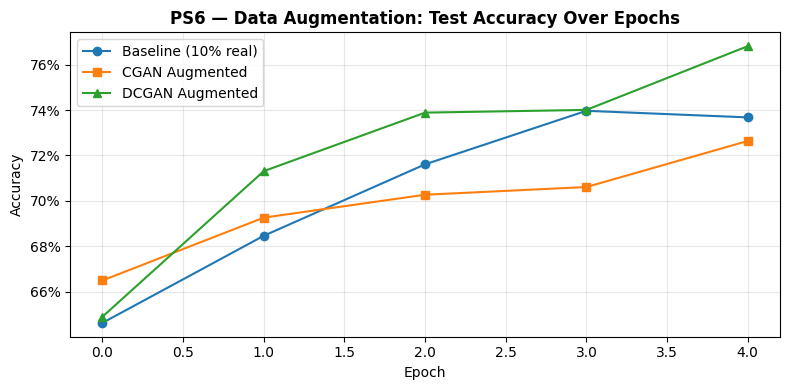

  Saved → lab6_outputs/PS6_data_augmentation_accuracy.png

--- Analysis ---
Does synthetic data help? YES
CGAN is label-controlled → more useful for class-balanced augmentation
DCGAN uses pseudo-labels → less targeted but still adds visual diversity


In [41]:
# ── Step 24: Evaluation Summary ───────────────────────────────
baseline_acc  = hist_baseline['test_acc'][-1]
cgan_aug_acc  = hist_cgan_aug['test_acc'][-1]
dcgan_aug_acc = hist_dcgan_aug['test_acc'][-1]

print("\n" + "="*65)
print("  PS6 — Data Augmentation Results (FashionMNIST Test Accuracy)")
print("="*65)
print(f"{'Configuration':<35} {'Test Accuracy':>15} {'Δ vs Baseline':>15}")
print("-"*65)
print(f"{'Baseline (10% real only)':<35} {baseline_acc*100:>14.2f}%  {'—':>15}")
print(f"{'CGAN Augmented (50%+50%)':<35} {cgan_aug_acc*100:>14.2f}%  {(cgan_aug_acc-baseline_acc)*100:>+14.2f}%")
print(f"{'DCGAN Augmented (50%+50%)':<35} {dcgan_aug_acc*100:>14.2f}%  {(dcgan_aug_acc-baseline_acc)*100:>+14.2f}%")

# Plot test accuracy curves
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(hist_baseline['test_acc'],  marker='o', label='Baseline (10% real)')
ax.plot(hist_cgan_aug['test_acc'],  marker='s', label='CGAN Augmented')
ax.plot(hist_dcgan_aug['test_acc'], marker='^', label='DCGAN Augmented')
ax.set_title('PS6 — Data Augmentation: Test Accuracy Over Epochs', fontweight='bold')
ax.set_xlabel('Epoch'); ax.set_ylabel('Accuracy'); ax.legend(); ax.grid(True, alpha=0.3)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y*100:.0f}%'))
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS6_data_augmentation_accuracy.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

# ── Step 25: Analysis ─────────────────────────────────────────
print("\n--- Analysis ---")
best_aug_acc = max(cgan_aug_acc, dcgan_aug_acc)
print(f"Does synthetic data help? {'YES' if best_aug_acc > baseline_acc else 'NOT in this run (try more epochs)'}")
print(f"CGAN is label-controlled → more useful for class-balanced augmentation")
print(f"DCGAN uses pseudo-labels → less targeted but still adds visual diversity")

---
# 📈 Problem Statement 7: Loss Function & Training Stability Analysis

Investigate how different GAN objective functions affect training stability and sample quality.

### GAN Variants
| Variant | Key Property |
|---------|-------------|
| Vanilla GAN | BCE minimax — baseline |
| Non-Saturating GAN | Better gradients for G early in training |
| WGAN | Wasserstein distance with weight clipping |
| WGAN-GP | Wasserstein + gradient penalty λ=10 |
| LSGAN | Least-squares loss — reduces vanishing gradients |


Training WGAN on FashionMNIST for 5 epochs (n_critic=5)...


python(63173) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63174) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/5 | C=-3.3983  G=-3.1051


python(63183) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63184) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/5 | C=-6.7425  G=-1.3963


python(63185) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63186) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/5 | C=-10.5807  G=-8.4034


python(63188) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63189) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   4/5 | C=-3.0451  G=15.5186


python(63190) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63191) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   5/5 | C=-3.3960  G=1.4186


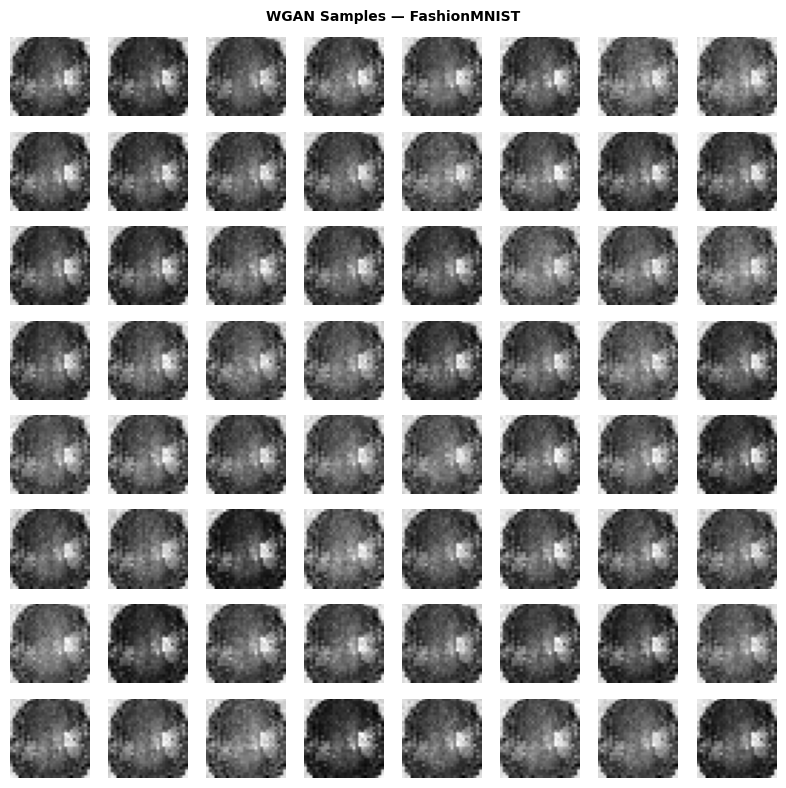

  Saved → lab6_outputs/PS7_wgan_samples.png


In [42]:
# ── WGAN ─────────────────────────────────────────────────────
class WGANDiscriminator(nn.Module):
    """Critic (no Sigmoid) for WGAN."""
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(784, 1024), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512,  256), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256,    1),
        )
    def forward(self, x): return self.net(x)


def train_wgan(G, C, train_loader, dataset_name='Dataset',
               epochs=EPOCHS, lr=5e-5, z_dim=Z_DIM_GAN,
               c_lambda=0.01, n_critic=5, fname_prefix='PS7_wgan'):
    """WGAN with weight clipping."""
    opt_C = optim.RMSprop(C.parameters(), lr=lr)
    opt_G = optim.RMSprop(G.parameters(), lr=lr)
    hist  = {'C_loss':[], 'G_loss':[]}
    fixed_z = torch.randn(64, z_dim, device=device)
    CLIP = 0.01   # weight clipping range

    print(f"\nTraining WGAN on {dataset_name} for {epochs} epochs (n_critic={n_critic})...")
    for epoch in range(1, epochs + 1):
        G.train(); C.train()
        c_ep = g_ep = 0.0; c_steps = 0

        for i, (real, _) in enumerate(train_loader):
            real = real.to(device); bs = real.size(0)
            z    = torch.randn(bs, z_dim, device=device)
            fake = G(z).detach()

            # Critic step
            opt_C.zero_grad()
            loss_C = -(C(real).mean() - C(fake).mean())
            loss_C.backward(); opt_C.step()
            # Weight clipping
            for p in C.parameters():
                p.data.clamp_(-CLIP, CLIP)
            c_ep += loss_C.item(); c_steps += 1

            # Generator step (every n_critic critic updates)
            if i % n_critic == 0:
                z    = torch.randn(bs, z_dim, device=device)
                fake = G(z)
                opt_G.zero_grad()
                loss_G = -C(fake).mean()
                loss_G.backward(); opt_G.step()
                g_ep += loss_G.item()

        hist['C_loss'].append(c_ep / max(c_steps, 1))
        hist['G_loss'].append(g_ep / max(1, len(train_loader) // n_critic))
        print(f"  Epoch {epoch:>3}/{epochs} | C={hist['C_loss'][-1]:.4f}  G={hist['G_loss'][-1]:.4f}")

    G.eval()
    with torch.no_grad():
        wgan_samples = G(fixed_z)
    save_image_grid(wgan_samples, f'WGAN Samples — {dataset_name}',
                    f'{fname_prefix}_samples.png', denorm=True)
    return hist


G_wgan = Generator().to(device)
C_wgan = WGANDiscriminator().to(device)
hist_wgan = train_wgan(G_wgan, C_wgan, loader_fm11_tr, 'FashionMNIST',
                        fname_prefix=f'{OUT_DIR}/PS7_wgan')


Training WGAN-GP on FashionMNIST for 5 epochs (λ=10)...


python(63192) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63193) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/5 | C=-13.9949  G=-2.1995


python(63196) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63197) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/5 | C=-12.2196  G=-1.2135


python(63199) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63200) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/5 | C=-8.2848  G=-1.5382


python(63201) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63202) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   4/5 | C=-7.0990  G=2.6791


python(63207) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63208) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   5/5 | C=-6.8216  G=5.3198


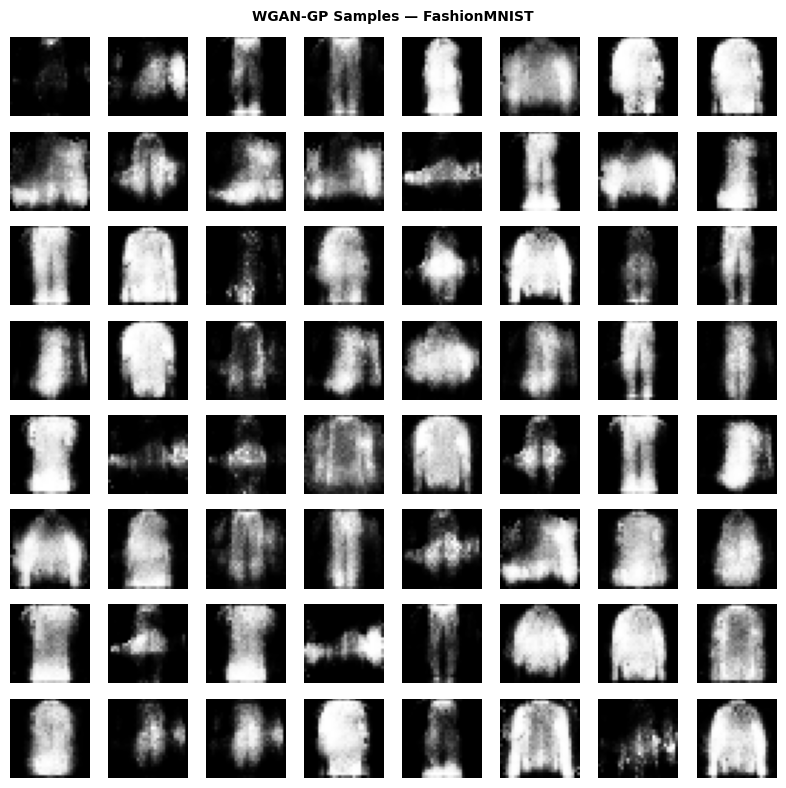

  Saved → lab6_outputs/PS7_wgangp_samples.png


In [43]:
# ── WGAN-GP ───────────────────────────────────────────────────
def train_wgan_gp(G, C, train_loader, dataset_name='Dataset',
                  epochs=EPOCHS, lr=1e-4, z_dim=Z_DIM_GAN,
                  lambda_gp=10, n_critic=5, fname_prefix='PS7_wgangp'):
    """WGAN-GP: Wasserstein + gradient penalty."""
    opt_C = optim.Adam(C.parameters(), lr=lr, betas=(0.0, 0.9))
    opt_G = optim.Adam(G.parameters(), lr=lr, betas=(0.0, 0.9))
    hist  = {'C_loss':[], 'G_loss':[]}
    fixed_z = torch.randn(64, z_dim, device=device)

    print(f"\nTraining WGAN-GP on {dataset_name} for {epochs} epochs (λ={lambda_gp})...")
    for epoch in range(1, epochs + 1):
        G.train(); C.train()
        c_ep = g_ep = 0.0; c_steps = 0

        for i, (real, _) in enumerate(train_loader):
            real = real.to(device); bs = real.size(0)
            z    = torch.randn(bs, z_dim, device=device)
            fake = G(z).detach()

            # Gradient penalty
            alpha  = torch.rand(bs, 1, 1, 1, device=device)
            interp = (alpha * real + (1-alpha) * fake).requires_grad_(True)
            d_interp = C(interp)
            grads  = torch.autograd.grad(d_interp, interp,
                                          grad_outputs=torch.ones_like(d_interp),
                                          create_graph=True)[0]
            gp = lambda_gp * ((grads.view(bs,-1).norm(2, dim=1) - 1)**2).mean()

            opt_C.zero_grad()
            loss_C = -(C(real).mean() - C(fake).mean()) + gp
            loss_C.backward(); opt_C.step()
            c_ep += loss_C.item(); c_steps += 1

            if i % n_critic == 0:
                z    = torch.randn(bs, z_dim, device=device)
                opt_G.zero_grad()
                loss_G = -C(G(z)).mean()
                loss_G.backward(); opt_G.step()
                g_ep += loss_G.item()

        hist['C_loss'].append(c_ep / max(c_steps, 1))
        hist['G_loss'].append(g_ep / max(1, len(train_loader) // n_critic))
        print(f"  Epoch {epoch:>3}/{epochs} | C={hist['C_loss'][-1]:.4f}  G={hist['G_loss'][-1]:.4f}")

    G.eval()
    with torch.no_grad():
        samples = G(fixed_z)
    save_image_grid(samples, f'WGAN-GP Samples — {dataset_name}',
                    f'{fname_prefix}_samples.png', denorm=True)
    return hist


G_wgangp = Generator().to(device)
C_wgangp = WGANDiscriminator().to(device)
hist_wgangp = train_wgan_gp(G_wgangp, C_wgangp, loader_fm11_tr, 'FashionMNIST',
                              fname_prefix=f'{OUT_DIR}/PS7_wgangp')


Training LSGAN on FashionMNIST for 5 epochs...


python(63227) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63228) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   1/5 | D=0.0626  G=0.5114


python(63235) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63236) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   2/5 | D=0.1034  G=0.4311


python(63266) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63267) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   3/5 | D=0.1145  G=0.3943


python(63268) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63269) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   4/5 | D=0.1422  G=0.3300


python(63271) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(63272) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


  Epoch   5/5 | D=0.1549  G=0.3035


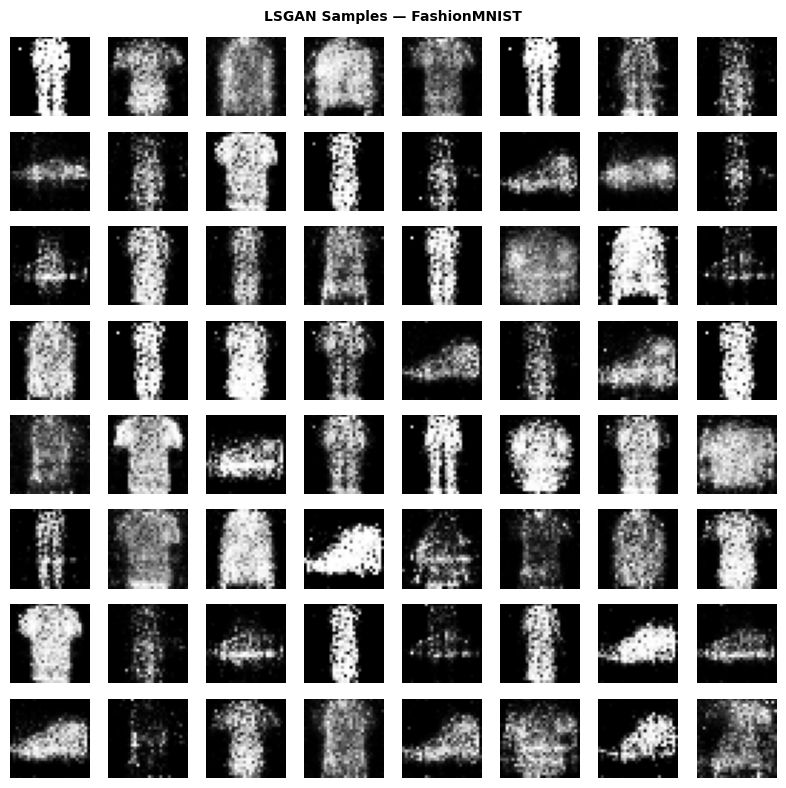

  Saved → lab6_outputs/PS7_lsgan_samples.png


In [44]:
# ── LSGAN ─────────────────────────────────────────────────────
def train_lsgan(G, D, train_loader, dataset_name='Dataset',
                epochs=EPOCHS, lr=LR_GAN, z_dim=Z_DIM_GAN,
                fname_prefix='PS7_lsgan'):
    """Least-Squares GAN: MSE loss instead of BCE."""
    opt_D = optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_G = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
    hist  = {'D_loss':[], 'G_loss':[]}
    fixed_z = torch.randn(64, z_dim, device=device)

    print(f"\nTraining LSGAN on {dataset_name} for {epochs} epochs...")
    for epoch in range(1, epochs + 1):
        G.train(); D.train()
        d_ep = g_ep = 0.0
        for real, _ in train_loader:
            real = real.to(device); bs = real.size(0)
            z    = torch.randn(bs, z_dim, device=device)
            fake = G(z).detach()

            opt_D.zero_grad()
            # LSGAN: D wants real→1, fake→0
            loss_D = 0.5 * (((D(real) - 1)**2).mean() + (D(fake)**2).mean())
            loss_D.backward(); opt_D.step()
            d_ep += loss_D.item()

            z    = torch.randn(bs, z_dim, device=device)
            fake = G(z)
            opt_G.zero_grad()
            # G wants D(fake) → 1
            loss_G = 0.5 * ((D(fake) - 1)**2).mean()
            loss_G.backward(); opt_G.step()
            g_ep += loss_G.item()

        hist['D_loss'].append(d_ep / len(train_loader))
        hist['G_loss'].append(g_ep / len(train_loader))
        print(f"  Epoch {epoch:>3}/{epochs} | D={hist['D_loss'][-1]:.4f}  G={hist['G_loss'][-1]:.4f}")

    G.eval()
    with torch.no_grad():
        samples = G(fixed_z)
    save_image_grid(samples, f'LSGAN Samples — {dataset_name}',
                    f'{fname_prefix}_samples.png', denorm=True)
    return hist


# LSGAN Discriminator (no Sigmoid, for MSE loss)
class LSDiscriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(784, 1024), nn.LeakyReLU(0.2, inplace=True), nn.Dropout(0.3),
            nn.Linear(1024, 512), nn.LeakyReLU(0.2, inplace=True), nn.Dropout(0.3),
            nn.Linear(512,  256), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256,    1),  # No Sigmoid
        )
    def forward(self, x): return self.net(x)


G_lsgan = Generator().to(device)
D_lsgan = LSDiscriminator().to(device)
hist_lsgan = train_lsgan(G_lsgan, D_lsgan, loader_fm11_tr, 'FashionMNIST',
                          fname_prefix=f'{OUT_DIR}/PS7_lsgan')

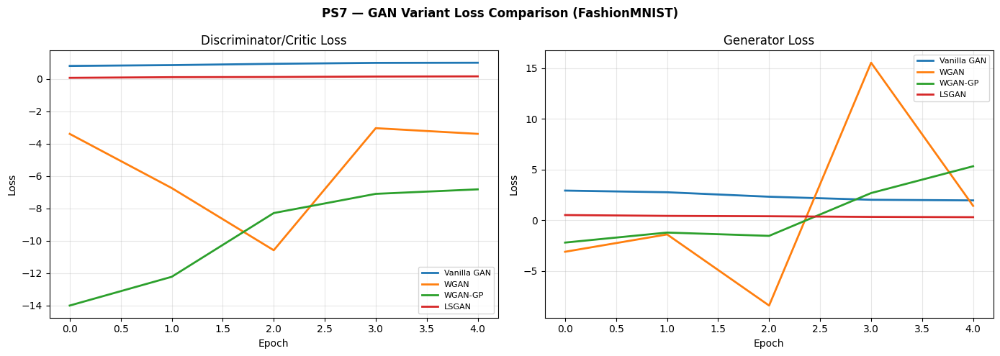

  Saved → lab6_outputs/PS7_gan_variants_loss_comparison.png

  PS7 — GAN VARIANT STABILITY SUMMARY
Variant           Final D/C Loss  Final G Loss  D Std (oscil)
------------------------------------------------------------
Vanilla GAN               0.9955        1.9563         0.0773
WGAN                     -3.3960        1.4186         2.9053
WGAN-GP                  -6.8216        5.3198         2.8929
LSGAN                     0.1549        0.3035         0.0323


In [45]:
# ── PS7: Combined Loss Comparison Plot ───────────────────────
all_variants = {
    'Vanilla GAN': hist_gan_fm,
    'WGAN':        {'D_loss': hist_wgan['C_loss'], 'G_loss': hist_wgan['G_loss']},
    'WGAN-GP':     {'D_loss': hist_wgangp['C_loss'], 'G_loss': hist_wgangp['G_loss']},
    'LSGAN':       hist_lsgan,
}

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple']

for i, (name, hist) in enumerate(all_variants.items()):
    d_key = 'D_loss' if 'D_loss' in hist else 'C_loss'
    axes[0].plot(hist[d_key], label=name, color=colors[i], linewidth=2)
    axes[1].plot(hist['G_loss'], label=name, color=colors[i], linewidth=2)

axes[0].set_title('Discriminator/Critic Loss'); axes[1].set_title('Generator Loss')
for ax in axes:
    ax.legend(fontsize=8); ax.grid(True, alpha=0.3); ax.set_xlabel('Epoch'); ax.set_ylabel('Loss')

fig.suptitle('PS7 — GAN Variant Loss Comparison (FashionMNIST)', fontweight='bold', fontsize=12)
plt.tight_layout()
path = os.path.join(OUT_DIR, 'PS7_gan_variants_loss_comparison.png')
plt.savefig(path, dpi=130, bbox_inches='tight'); plt.show(); plt.close()
print(f"  Saved → {path}")

# Summary table
print("\n" + "="*75)
print("  PS7 — GAN VARIANT STABILITY SUMMARY")
print("="*75)
print(f"{'Variant':<16} {'Final D/C Loss':>15} {'Final G Loss':>13} {'D Std (oscil)':>14}")
print("-"*60)
for name, hist in all_variants.items():
    d_key = 'D_loss' if 'D_loss' in hist else 'C_loss'
    d_std  = float(np.std(hist[d_key])) if len(hist[d_key]) > 1 else 0.0
    print(f"{name:<16} {hist[d_key][-1]:>15.4f} {hist['G_loss'][-1]:>13.4f} {d_std:>14.4f}")

---
# ✅ Final Output Summary

In [46]:
import glob
print("\n" + "="*60)
print("  ALL OUTPUT FILES")
print("="*60)
for f in sorted(glob.glob(f'{OUT_DIR}/*.png')):
    sz = os.path.getsize(f) / 1024
    print(f"  {os.path.basename(f):<52}  {sz:>6.1f} KB")

summary = [
    "PS1: VAE     - Reconstruction, Traversal, Sampling, z-dim Study, CVAE, t-SNE",
    "PS2: GAN     - Training, Mode Collapse, Noise Dim Study, Gradient Penalty",
    "PS3: CGAN    - Class Grid, Label Interp, Mismatch Attack, Intra-Class Diversity",
    "PS4: DCGAN   - Training, BN Ablation, Spectral Norm, Prog Growing, Arithmetic",
    "PS5: Compare - Side-by-side samples, Quantitative Table, Architecture Table",
    "PS6: DataAug - Baseline vs CGAN/DCGAN Augmented Classifier Accuracy",
    "PS7: LossFns - Vanilla GAN / WGAN / WGAN-GP / LSGAN Stability Analysis",
]
print("\n" + "="*60)
print("  LAB 6 COMPLETE - All 7 Problem Statements Done")
print("="*60)
for s in summary:
    print(" ", s)



  ALL OUTPUT FILES
  PS1_cvae_class_generation.png                          128.5 KB
  PS1_vae_emnist_loss.png                                 34.2 KB
  PS1_vae_emnist_recon.png                                45.7 KB
  PS1_vae_emnist_samples.png                              80.0 KB
  PS1_vae_emnist_traversal.png                            23.1 KB
  PS1_vae_fmnist_loss.png                                 28.9 KB
  PS1_vae_fmnist_recon.png                                46.4 KB
  PS1_vae_fmnist_samples.png                              93.1 KB
  PS1_vae_fmnist_traversal.png                            24.8 KB
  PS1_vae_tsne.png                                       287.0 KB
  PS1_vae_zdim128_recon.png                               22.3 KB
  PS1_vae_zdim32_recon.png                                22.1 KB
  PS1_vae_zdim8_recon.png                                 21.8 KB
  PS2_gan_emnist_epoch005.png                             81.7 KB
  PS2_gan_emnist_loss.png                               